In [1]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns 
import sklearn
import warnings
import lasio

from sklearn import preprocessing

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### Log Data

In [2]:
Well1_path = '/Users/rishabhpandey/Desktop/Spring 2021/Data Analytics/Python/MIP3H_Log Data 1.las'
Well1 = lasio.read(Well1_path)

In [3]:
Well1.keys()

['MD',
 'BS',
 'C11_TIV',
 'C12_TIV',
 'C13_TIV',
 'C33_TIV',
 'C44_TIV',
 'C55_TIV',
 'C66_TIV',
 'DEVI',
 'DTCO',
 'DTSM_FAST',
 'DTSM_SLOW',
 'GAMMA_TIV',
 'GR_EDTC',
 'HAZI',
 'PPGI',
 'PPRS',
 'PR_HORZ',
 'PR_VERT',
 'RHOB_MODEL',
 'TVD',
 'TXSG_ISO',
 'TXSG_TIV',
 'TXSP_ISO',
 'TXSP_TIV',
 'TZSG',
 'TZSP',
 'YME_HORZ',
 'YME_HORZ_STATIC',
 'YME_VERT',
 'YME_VERT_STATIC']

In [4]:
print(Well1.curves)

Mnemonic         Unit      Value  Description                          
--------         ----      -----  -----------                          
MD               ft               Measured Depth                       
BS               in               Bit Size                             
C11_TIV          Mpsi             Elastic Modulus                      
C12_TIV          Mpsi             Elastic Modulus                      
C13_TIV          Mpsi             Elastic Modulus                      
C33_TIV          Mpsi             Elastic Modulus                      
C44_TIV          Mpsi             Elastic Modulus                      
C55_TIV          Mpsi             Elastic Modulus                      
C66_TIV          Mpsi             Elastic Modulus                      
DEVI             dega             Borehole Deviation                   
DTCO             us/ft            Delta-T Compressional                
DTSM_FAST        us/ft            Fast Shear Slowness           

### Reading in to a Pandas Dataframe Directly from a .LAS file

In [5]:
Well_Log = lasio.read(Well1_path)
Well_Log.data.shape

(12021, 32)

### Converting the Lasio object to a Pandas Dataframe

In [6]:
logdataframe = Well_Log.df()
logdataframe.head()

,BS,C11_TIV,C12_TIV,C13_TIV,C33_TIV,C44_TIV,C55_TIV,C66_TIV,DEVI,DTCO,...,TXSG_ISO,TXSG_TIV,TXSP_ISO,TXSP_TIV,TZSG,TZSP,YME_HORZ,YME_HORZ_STATIC,YME_VERT,YME_VERT_STATIC
MD,,,,,,,,,,,,,,,,,,,,,
7800.0,8.75,8.867062,2.822681,2.822681,4.864028,1.463345,1.463345,3.022190,76.92209,62.14146,...,0.885948,0.980012,6615.509,7317.902,1.164,8691.767,7.034883,4.327308,3.500863,1.824288
7800.5,8.75,9.407922,3.251067,3.251067,5.283070,1.475713,1.475713,3.078428,76.97486,60.59818,...,0.911738,0.999794,6808.191,7465.727,1.164,8691.898,7.196208,4.450464,3.613200,1.897015
7801.0,8.75,9.443237,3.312128,3.312128,5.283792,1.453392,1.453392,3.065555,77.02763,60.49287,...,0.916256,1.005301,6842.027,7506.967,1.164,8692.029,7.159695,4.422531,3.563701,1.864903
7801.5,8.75,8.839002,2.871549,2.871549,4.821222,1.424126,1.424126,2.983726,77.08040,62.22048,...,0.891560,0.987243,6657.713,7372.226,1.164,8692.159,6.939528,4.254828,3.412954,1.767761
7802.0,8.75,8.039583,2.265123,2.265123,4.098688,1.361601,1.361601,2.887230,77.13317,64.70718,...,0.846970,0.961199,6324.836,7177.851,1.164,8692.289,6.636500,4.026076,3.102874,1.571175


In [7]:
Well_Log = logdataframe.rename_axis('DEPTH').reset_index()
Well_Log.head()

,DEPTH,BS,C11_TIV,C12_TIV,C13_TIV,C33_TIV,C44_TIV,C55_TIV,C66_TIV,DEVI,...,TXSG_ISO,TXSG_TIV,TXSP_ISO,TXSP_TIV,TZSG,TZSP,YME_HORZ,YME_HORZ_STATIC,YME_VERT,YME_VERT_STATIC
0,7800.0,8.75,8.867062,2.822681,2.822681,4.864028,1.463345,1.463345,3.022190,76.92209,...,0.885948,0.980012,6615.509,7317.902,1.164,8691.767,7.034883,4.327308,3.500863,1.824288
1,7800.5,8.75,9.407922,3.251067,3.251067,5.283070,1.475713,1.475713,3.078428,76.97486,...,0.911738,0.999794,6808.191,7465.727,1.164,8691.898,7.196208,4.450464,3.613200,1.897015
2,7801.0,8.75,9.443237,3.312128,3.312128,5.283792,1.453392,1.453392,3.065555,77.02763,...,0.916256,1.005301,6842.027,7506.967,1.164,8692.029,7.159695,4.422531,3.563701,1.864903
3,7801.5,8.75,8.839002,2.871549,2.871549,4.821222,1.424126,1.424126,2.983726,77.08040,...,0.891560,0.987243,6657.713,7372.226,1.164,8692.159,6.939528,4.254828,3.412954,1.767761
4,7802.0,8.75,8.039583,2.265123,2.265123,4.098688,1.361601,1.361601,2.887230,77.13317,...,0.846970,0.961199,6324.836,7177.851,1.164,8692.289,6.636500,4.026076,3.102874,1.571175


### Selecting Depth and RHOB


In [8]:
Well_Log_1 = Well_Log[['DEPTH', 'RHOB_MODEL']]

### Matrix Scatter Plot

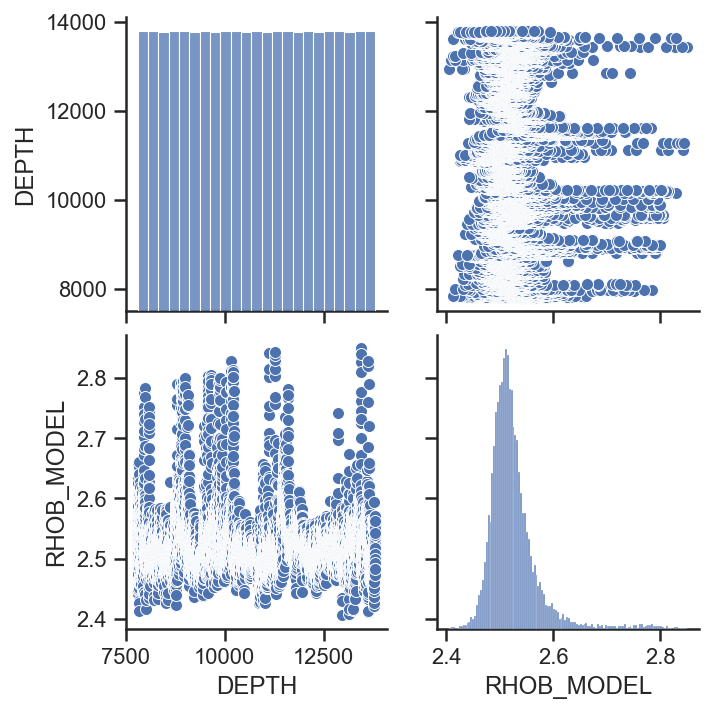

In [9]:
sns.set(style = 'ticks')
sns.pairplot(Well_Log_1)

<AxesSubplot:ylabel='RHOB_MODEL'>

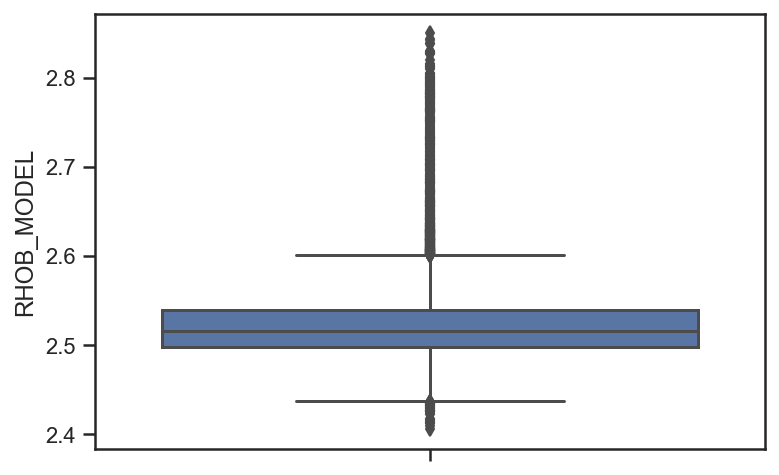

In [10]:
sns.boxplot(y = Well_Log_1['RHOB_MODEL'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'RHOB_MODEL'}>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

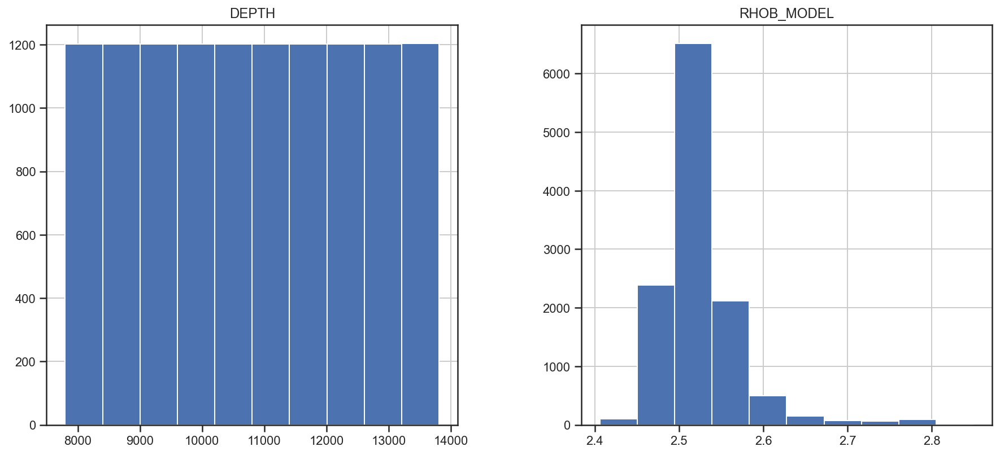

In [11]:
Well_Log_1.hist(figsize = (15, 15), layout = (2,2))

In [12]:
depth = Well_Log_1['DEPTH']
nphi = Well_Log_1['RHOB_MODEL']

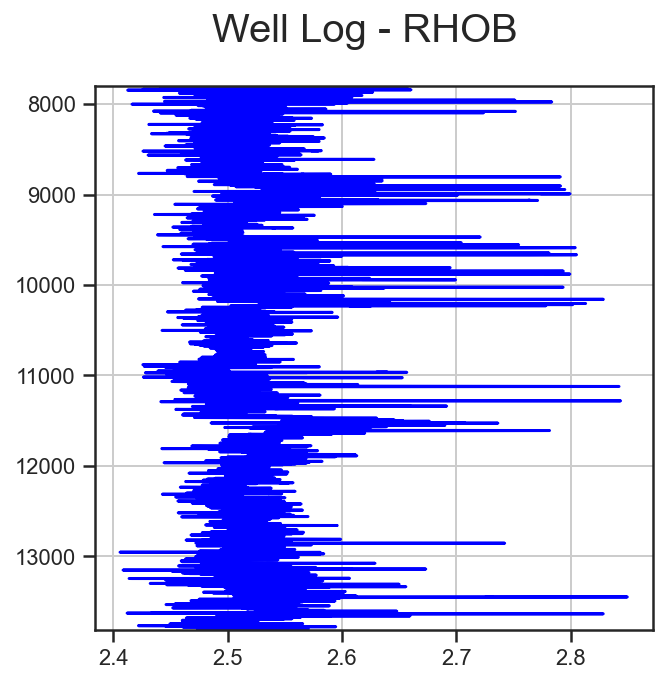

In [13]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - RHOB', size=20)

plt.subplot(1,1,1)
plt.plot(nphi, depth, color='blue')
plt.ylim(max(depth), min(depth))
plt.grid()

plt.show()

### Missing Values

In [14]:
Well_Log_1.isna().sum()

DEPTH         0
RHOB_MODEL    0
dtype: int64

In [15]:
Well_Log_1.describe()

,DEPTH,RHOB_MODEL
count,12021.000000,12021.000000
mean,10805.000000,2.525050
std,1735.154064,0.048060
min,7800.000000,2.405714
25%,9302.500000,2.498024
50%,10805.000000,2.515917
75%,12307.500000,2.539040
max,13810.000000,2.849662


In [16]:
RHOB_Data = Well_Log_1.copy()

### Removing Outliers

In [17]:
from scipy import stats

RHOB_Data_MIP = RHOB_Data[['DEPTH','RHOB_MODEL']]

RHOB_Data_MIP = RHOB_Data_MIP[(np.abs(stats.zscore(RHOB_Data_MIP)) < 3).all(axis=1)]

RHOB_Data = RHOB_Data.merge(RHOB_Data_MIP,on=['DEPTH','RHOB_MODEL'])

In [18]:
RHOB_Data_MIP.describe()

,DEPTH,RHOB_MODEL
count,11759.000000,11759.000000
mean,10821.531976,2.520154
std,1738.184682,0.034847
min,7800.000000,2.405714
25%,9312.750000,2.497622
50%,10837.000000,2.515105
75%,12328.750000,2.537092
max,13810.000000,2.669037


### Matrix Scatter Plots, Box Plots and Histogram after removing Outliers and negative values

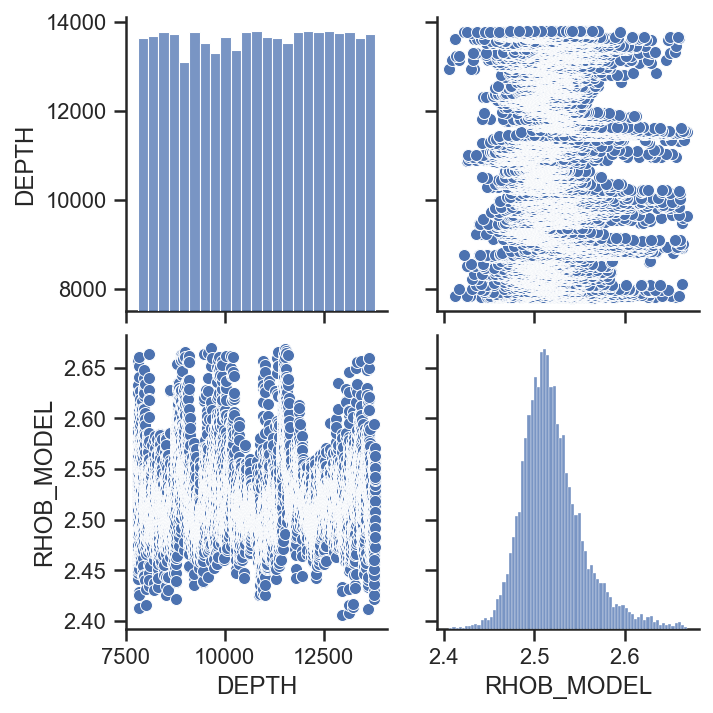

In [19]:
sns.set(style = 'ticks')
sns.pairplot(RHOB_Data_MIP)

<AxesSubplot:ylabel='RHOB_MODEL'>

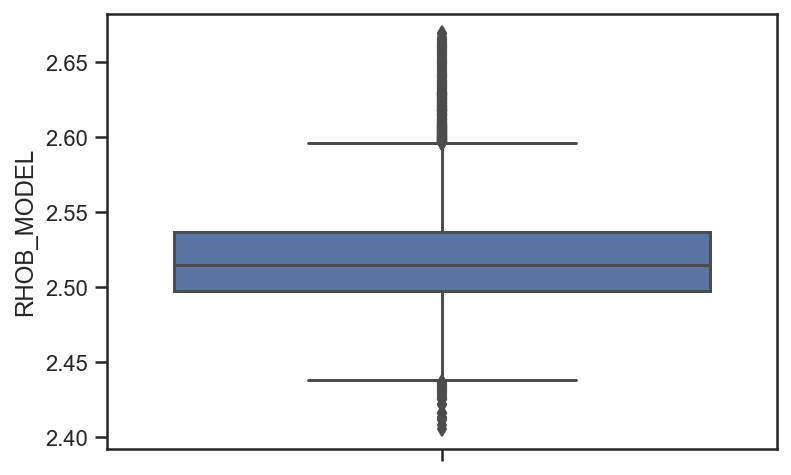

In [20]:
sns.boxplot(y = RHOB_Data_MIP['RHOB_MODEL'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'RHOB_MODEL'}>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

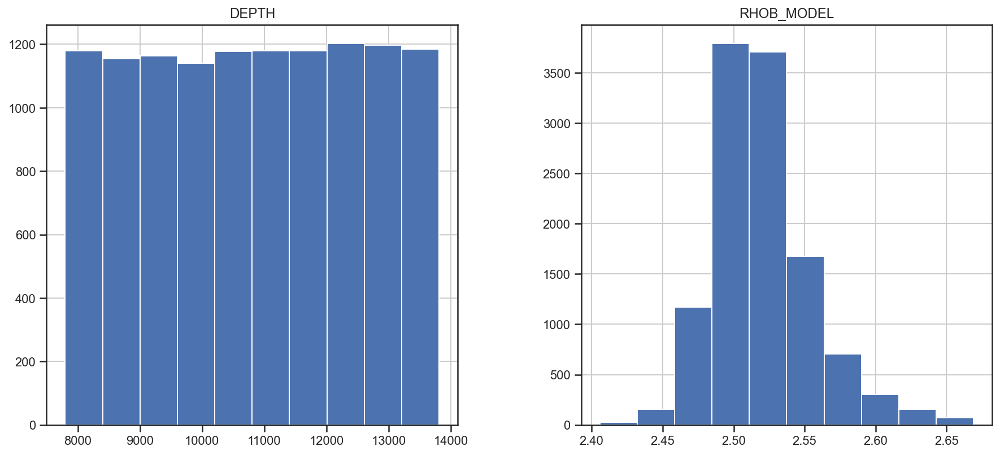

In [21]:
RHOB_Data_MIP.hist(figsize = (15, 15), layout = (2,2))

In [22]:
col_names = list(RHOB_Data_MIP.columns)
print(col_names)

['DEPTH', 'RHOB_MODEL']


In [23]:
Depth = RHOB_Data_MIP['DEPTH']
Rhob = RHOB_Data_MIP['RHOB_MODEL']

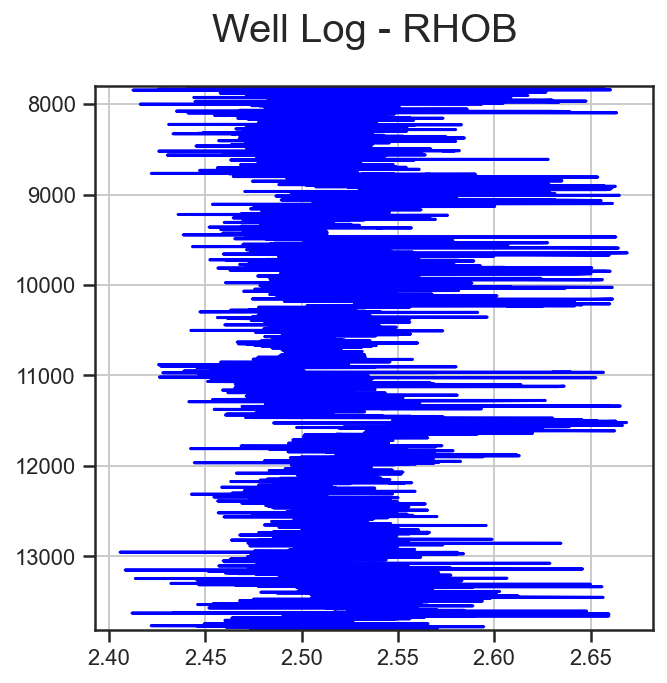

In [24]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - RHOB', size=20)

plt.subplot(1,1,1)
plt.plot(Rhob, Depth, color='blue')
plt.ylim(max(Depth),min(Depth))
plt.grid()

plt.show()

### Drilling Data

In [25]:
drilling_data_subset = pd.read_csv('MIP3H Drilling Data.csv', header = 0)
drilling_data_subset.head()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
0,6850,88.51,6.915,16.7,37,354.4
1,6851,62.76,5.960,15.4,32,166.0
2,6852,56.92,8.597,16.1,32,178.7
3,6853,142.70,4.252,13.5,35,101.5
4,6854,142.87,9.054,13.6,32,44.1


In [26]:
drilling_data_subset.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,7044.000000,7044.000000,7044.000000,7044.000000,7044.000000,7044.000000
mean,10367.166809,189.018698,12.370597,26.556601,30.471749,187.944187
std,2029.687641,107.714113,3.521571,9.830599,11.367029,4177.729697
min,6850.000000,0.150000,0.033000,0.000000,2.000000,-999.250000
25%,8611.750000,150.110000,10.642000,24.000000,28.000000,85.900000
50%,10369.500000,209.245000,13.087000,28.300000,29.000000,96.400000
75%,12124.250000,236.245000,14.951000,30.500000,29.000000,113.700000
max,13879.000000,2940.600000,19.020000,101.400000,94.000000,330292.000000


### Matrix Scatter Plot

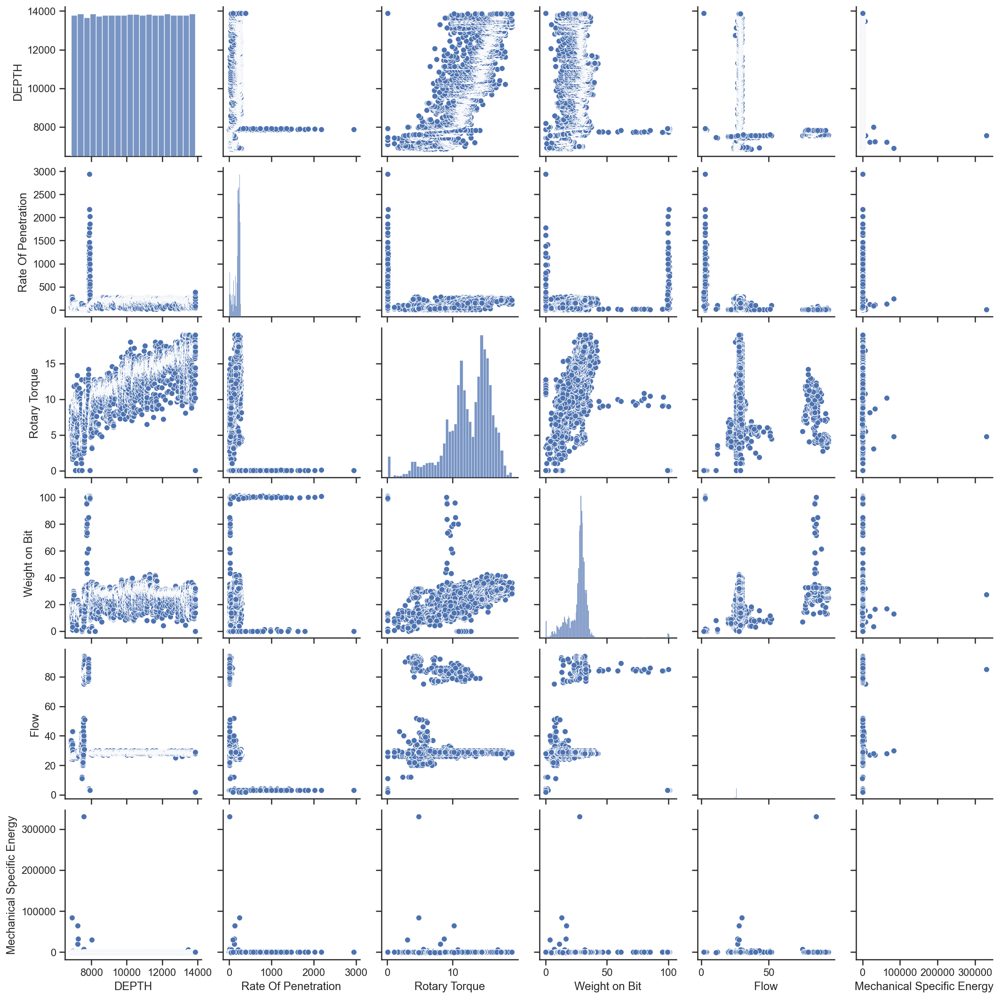

In [27]:
sns.set(style = 'ticks')
sns.pairplot(drilling_data_subset)

### Box Plots

<AxesSubplot:ylabel='Rate Of Penetration'>

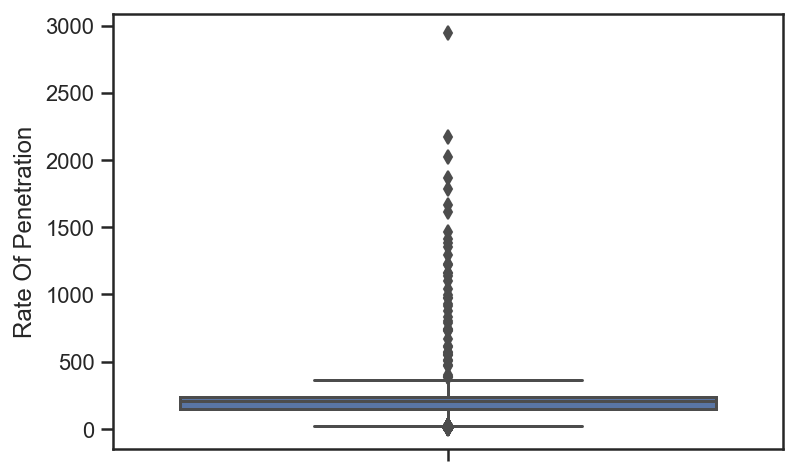

In [28]:
sns.boxplot(y = drilling_data_subset['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

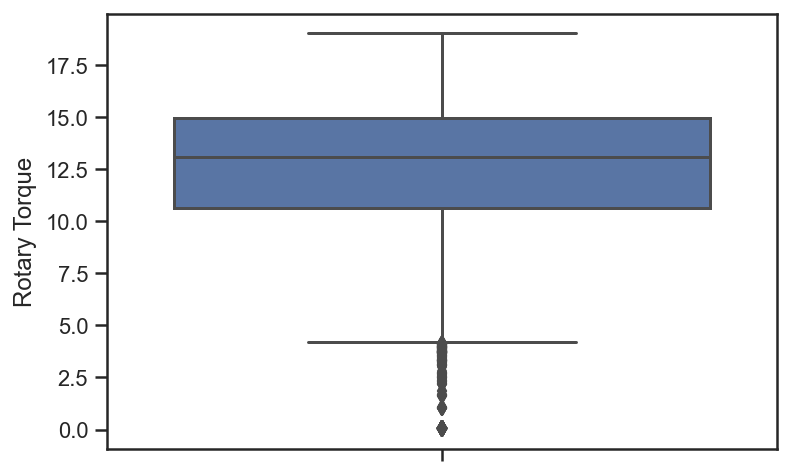

In [29]:
sns.boxplot(y = drilling_data_subset['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

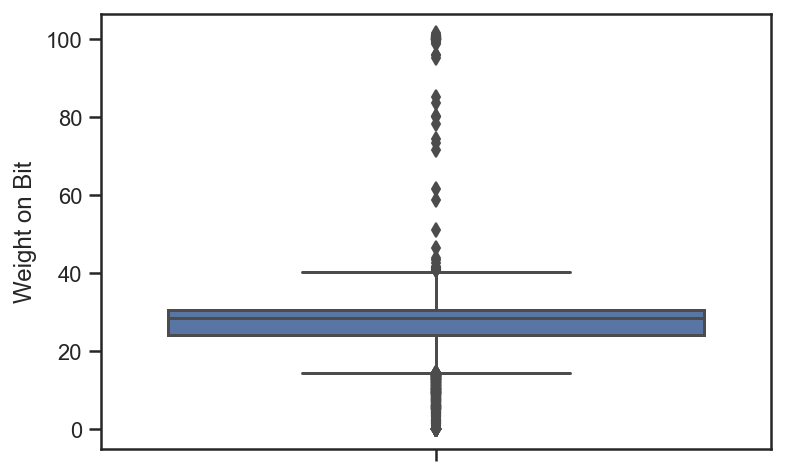

In [30]:
sns.boxplot(y = drilling_data_subset['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

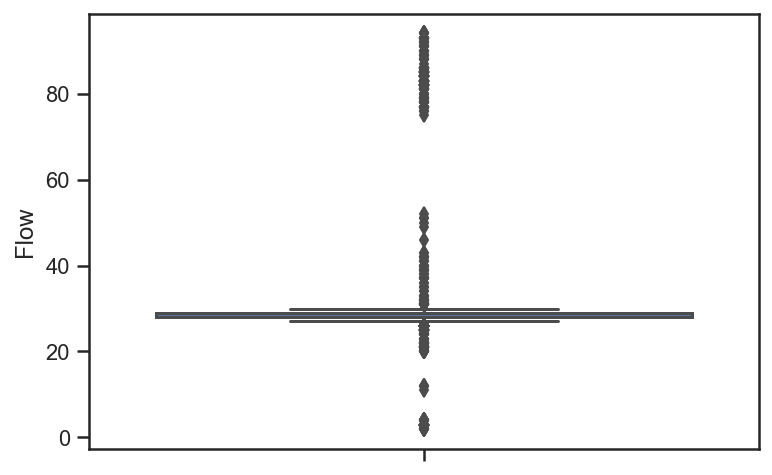

In [31]:
sns.boxplot(y = drilling_data_subset['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

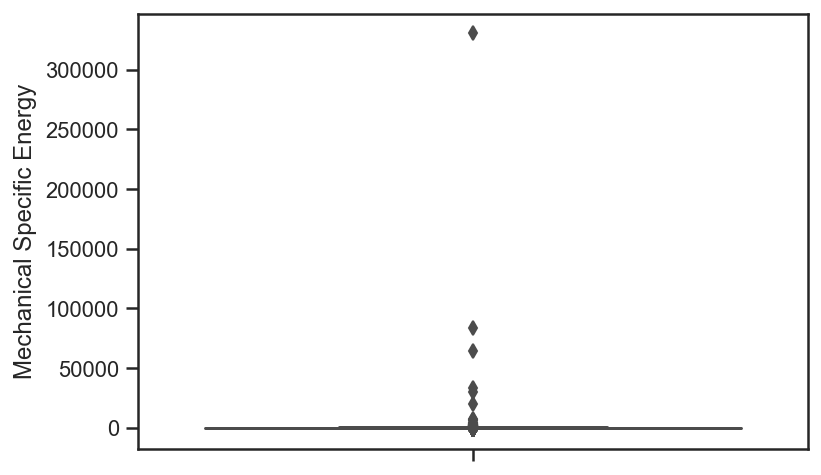

In [32]:
sns.boxplot(y = drilling_data_subset['Mechanical Specific Energy'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

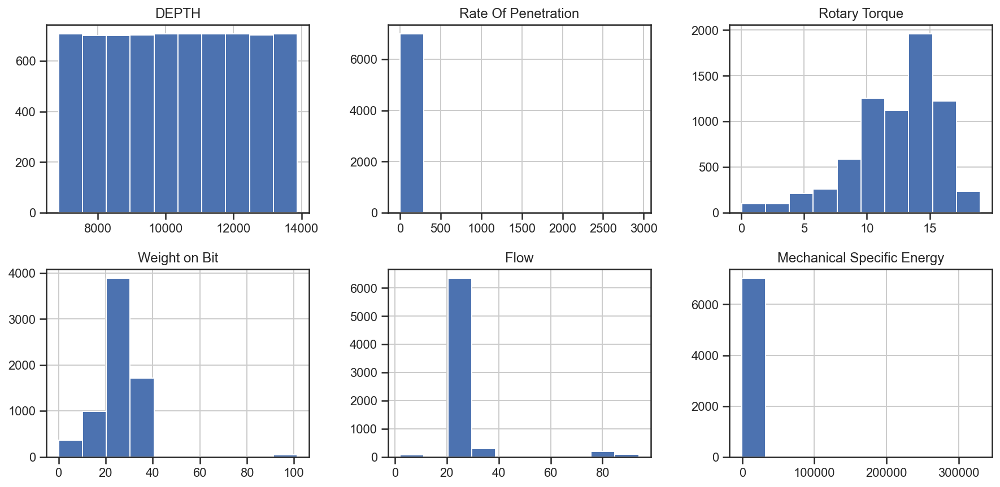

In [33]:
drilling_data_subset.hist(figsize = (15, 15), layout = (4,3))

### Removing Zero ROP, WOB and Negative MSE Values

In [34]:
drillingdata = drilling_data_subset[(drilling_data_subset['Rate Of Penetration'] > 0) & (drilling_data_subset['Weight on Bit'] > 0) &  (drilling_data_subset['Mechanical Specific Energy'] > 0)]
drillingdata.head()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
0,6850,88.51,6.915,16.7,37,354.4
1,6851,62.76,5.960,15.4,32,166.0
2,6852,56.92,8.597,16.1,32,178.7
3,6853,142.70,4.252,13.5,35,101.5
4,6854,142.87,9.054,13.6,32,44.1


In [35]:
drillingdata.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,6596.000000,6596.000000,6596.000000,6596.000000,6596.000000,6596.000000
mean,10506.424803,195.673096,12.636538,27.074378,28.767283,219.599439
std,1981.593868,87.513928,3.384345,9.116901,5.627316,4313.809105
min,6850.000000,2.760000,0.033000,0.300000,3.000000,1.700000
25%,8880.750000,177.767500,10.949000,25.400000,28.000000,88.000000
50%,10543.500000,212.230000,13.527000,28.500000,29.000000,97.700000
75%,12207.250000,237.940000,15.052000,30.600000,29.000000,115.700000
max,13874.000000,2173.500000,19.020000,101.400000,94.000000,330292.000000


### Missing Values

In [36]:
drillingdata.isna().sum() 

DEPTH                         0
Rate Of Penetration           0
Rotary Torque                 0
Weight on Bit                 0
Flow                          0
Mechanical Specific Energy    0
dtype: int64

### Removing Outliers

In [37]:
from scipy import stats

drilling_data_MIP = drillingdata[['DEPTH', 'Rate Of Penetration', 'Rotary Torque', 'Weight on Bit', 'Flow', 'Mechanical Specific Energy']]

drilling_data_MIP = drilling_data_MIP[(np.abs(stats.zscore(drilling_data_MIP)) < 3).all(axis=1)]

drillingdata = drillingdata.merge(drilling_data_MIP,on=['DEPTH','Rate Of Penetration', 'Rotary Torque',  'Weight on Bit', 'Flow', 'Mechanical Specific Energy'])

In [38]:
drilling_data_MIP.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,6465.000000,6465.000000,6465.000000,6465.000000,6465.000000,6465.000000
mean,10565.452127,194.421918,12.845729,26.670131,28.524981,133.285197
std,1956.814967,60.516222,3.062441,6.658779,1.309725,197.449323
min,6850.000000,3.460000,2.525000,0.300000,12.000000,2.200000
25%,8980.000000,180.280000,11.066000,25.600000,28.000000,88.100000
50%,10607.000000,212.710000,13.617000,28.500000,29.000000,97.700000
75%,12240.000000,237.890000,15.086000,30.600000,29.000000,115.000000
max,13874.000000,291.980000,19.020000,42.600000,43.000000,6585.600000


### Matrix Scatter Plots, Box Plots and Histogram after removing Outliners and negative values

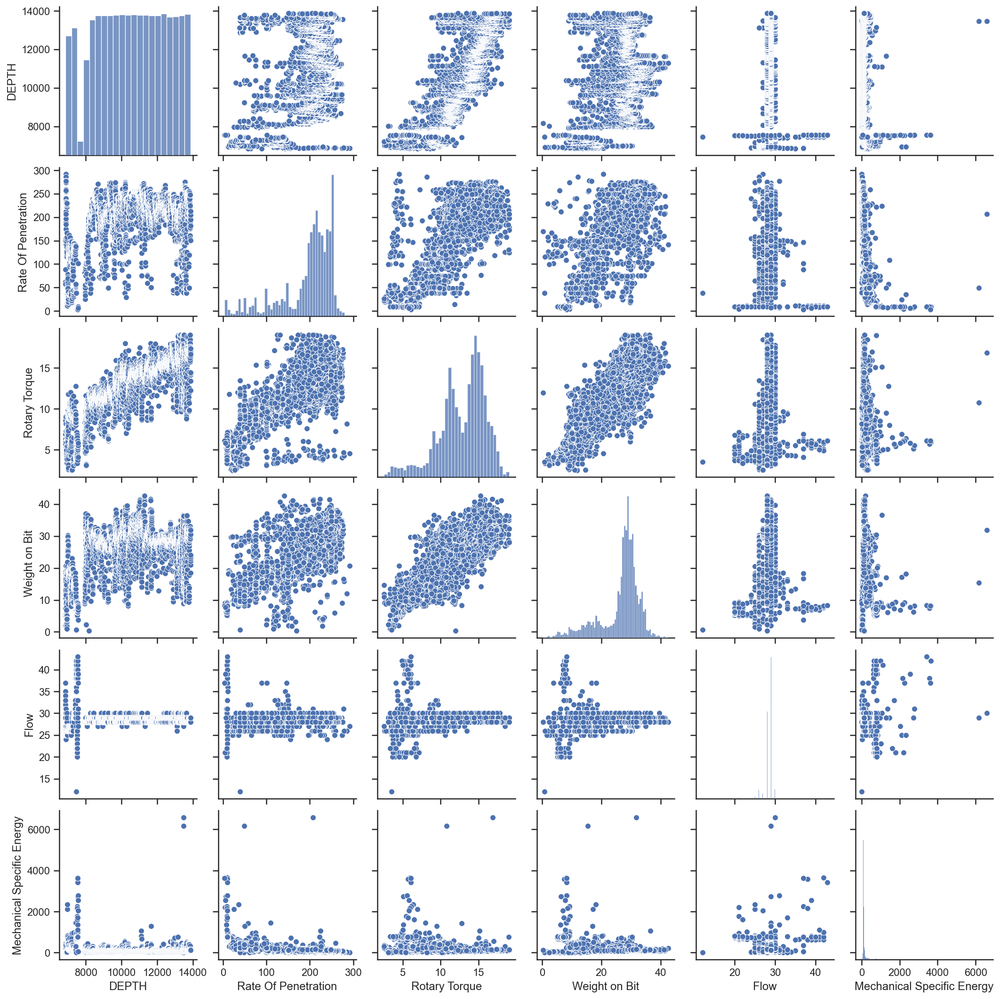

In [39]:
sns.set(style = 'ticks')
sns.pairplot(drilling_data_MIP)

<AxesSubplot:ylabel='Rate Of Penetration'>

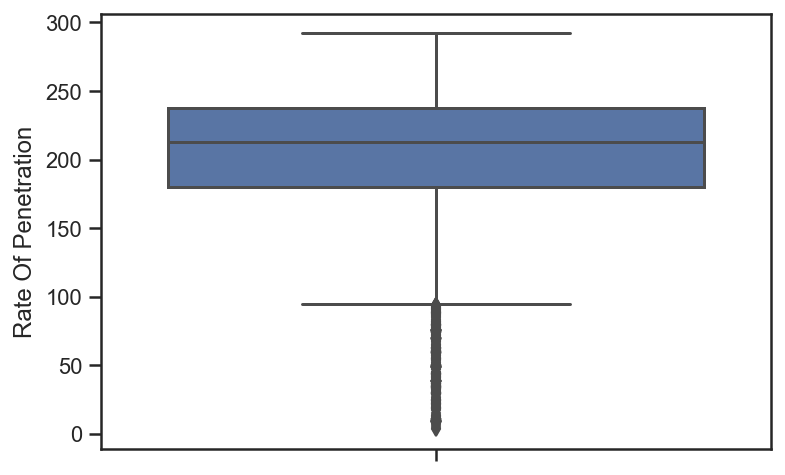

In [40]:
sns.boxplot(y = drilling_data_MIP['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

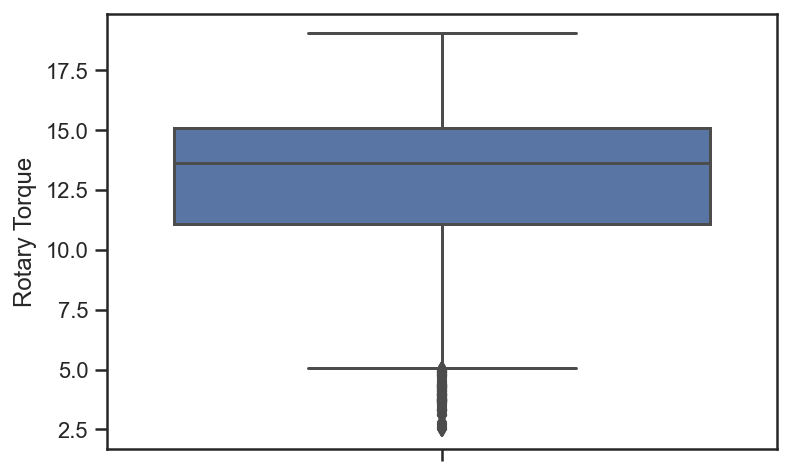

In [41]:
sns.boxplot(y = drilling_data_MIP['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

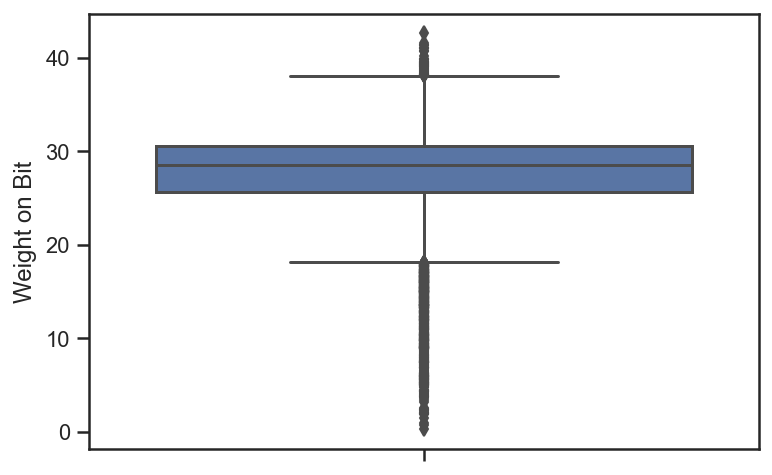

In [42]:
sns.boxplot(y = drilling_data_MIP['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

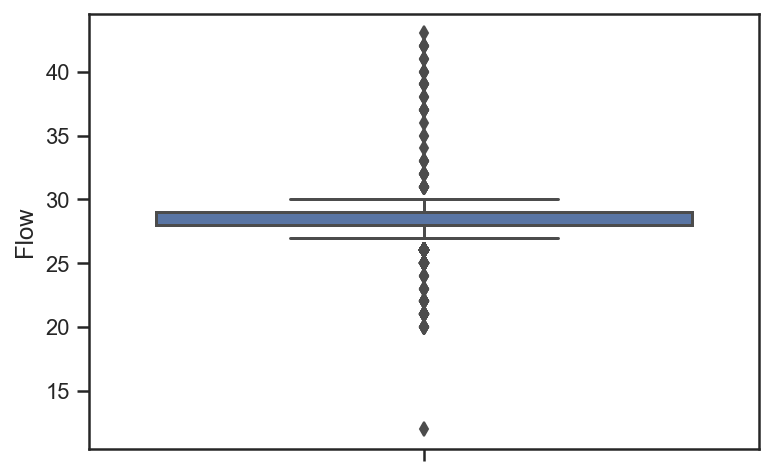

In [43]:
sns.boxplot(y = drilling_data_MIP['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

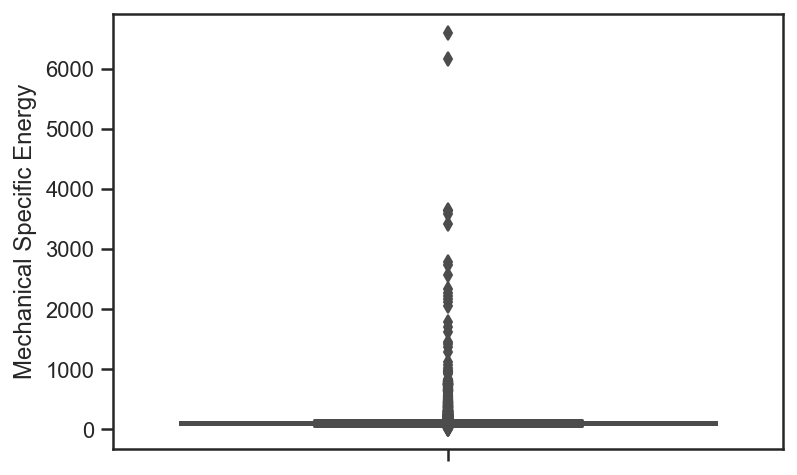

In [44]:
sns.boxplot(y = drilling_data_MIP['Mechanical Specific Energy'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

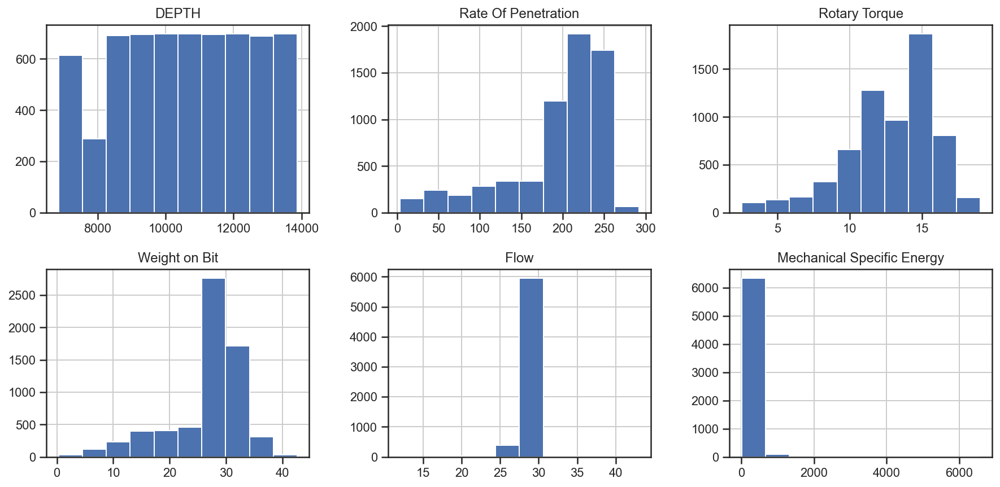

In [45]:
drilling_data_MIP.hist(figsize = (15, 15), layout = (4,3))

### Merged Drilling and RHOB Data

In [46]:
Data = pd.merge(left = drilling_data_MIP, right = RHOB_Data_MIP, left_on = 'DEPTH', right_on = 'DEPTH')
Data.head()

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:1123: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation
  warnings.warn(


,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy,RHOB_MODEL
0,7921,48.79,6.050,10.2,28,84.0,2.520296
1,7922,48.75,5.971,10.3,28,82.5,2.540117
2,7923,48.76,5.949,10.2,28,76.2,2.608679
3,7924,48.79,6.039,10.2,28,75.9,2.555703
4,7925,48.81,5.769,9.5,28,73.5,2.496360


In [47]:
Data.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy,RHOB_MODEL
count,5652.000000,5652.000000,5652.000000,5652.000000,5652.000000,5652.000000,5652.000000
mean,10905.578910,205.609779,13.420116,28.009006,28.647028,112.188942,2.520118
std,1689.966423,49.520391,2.442789,5.140006,0.553431,131.708921,0.034758
min,7921.000000,24.680000,3.094000,0.300000,26.000000,11.700000,2.408362
25%,9442.750000,195.462500,11.553000,26.900000,28.000000,87.400000,2.497855
50%,10917.500000,216.340000,13.966000,28.800000,29.000000,95.900000,2.514861
75%,12369.250000,240.172500,15.191000,30.800000,29.000000,108.700000,2.536861
max,13810.000000,276.210000,19.020000,42.600000,30.000000,6585.600000,2.668696


In [48]:
Data.isna().sum()

DEPTH                         0
Rate Of Penetration           0
Rotary Torque                 0
Weight on Bit                 0
Flow                          0
Mechanical Specific Energy    0
RHOB_MODEL                    0
dtype: int64

In [49]:
Data.dropna(how='any', inplace=True)
Data.isnull().sum().sum()

0

In [50]:
Depth = Data['DEPTH']
Rhob = Data['RHOB_MODEL']

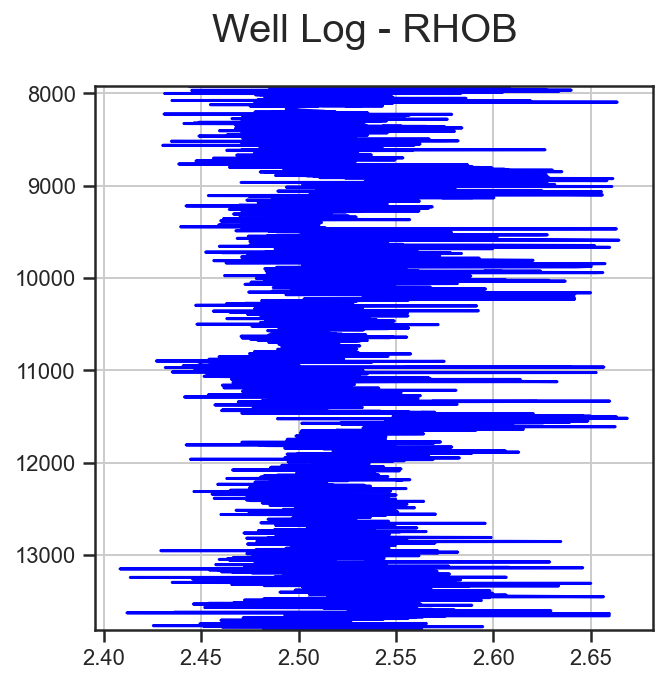

In [51]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - RHOB', size=20)

plt.subplot(1,1,1)
plt.plot(Rhob, Depth, color='blue')
plt.ylim(max(Depth),min(Depth))
plt.grid()

plt.show()

### Matrix Scatter Plot, Box Plot and Histrogram after merging the data

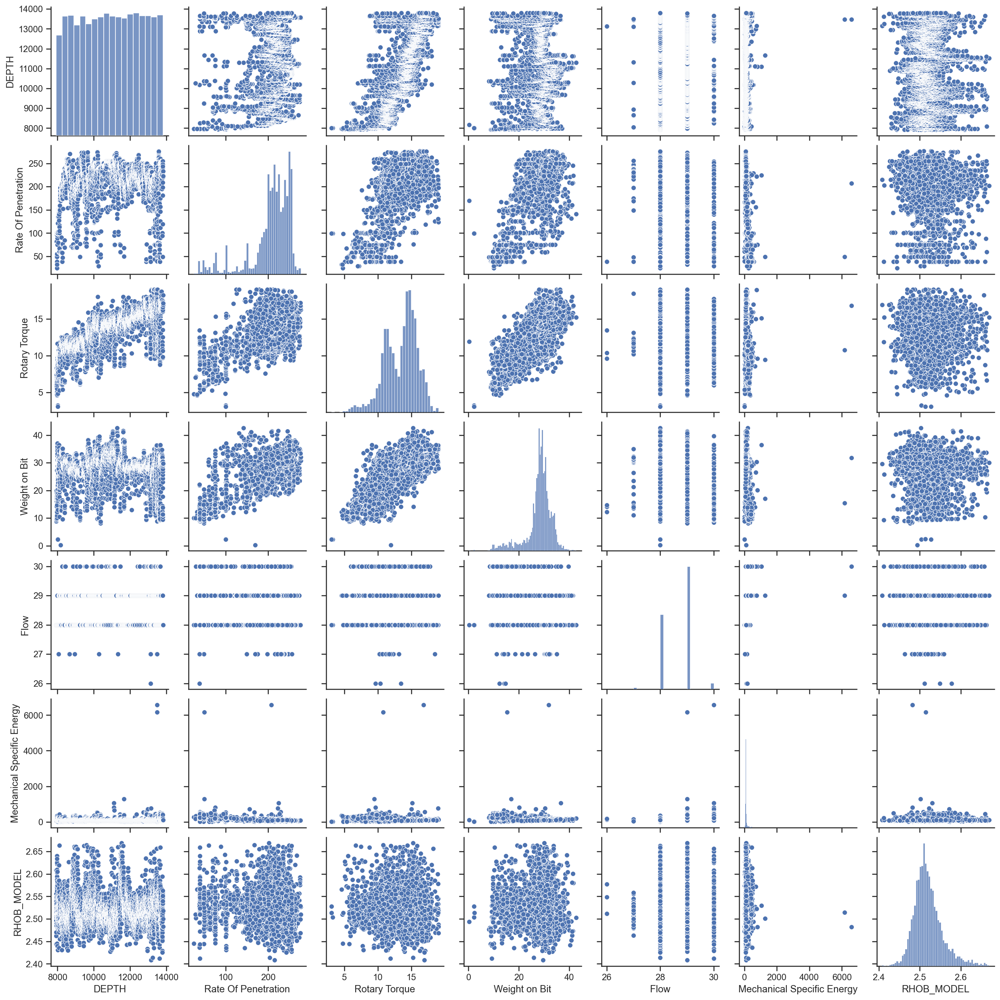

In [52]:
sns.set(style = 'ticks')
sns.pairplot(Data)

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:title={'center':'RHOB_MODEL'}>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

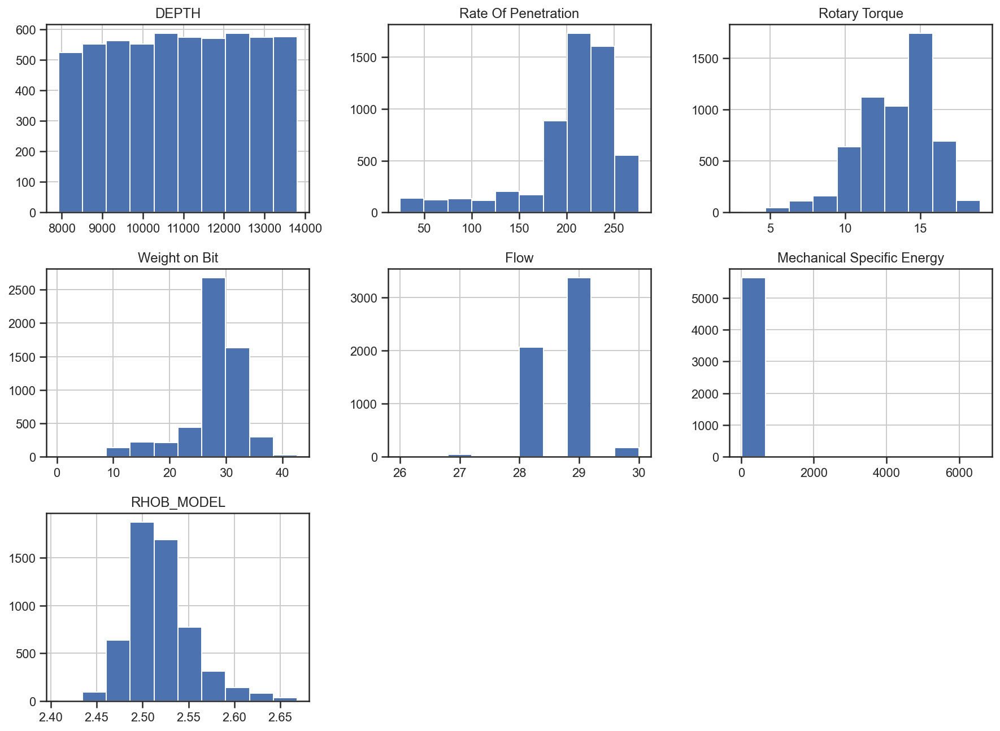

In [53]:
Data.hist(figsize = (15, 15), layout = (4,3))

<AxesSubplot:ylabel='Rate Of Penetration'>

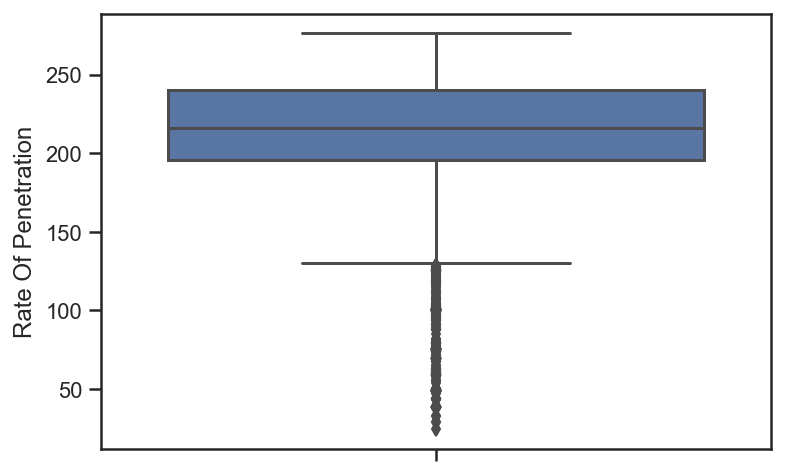

In [54]:
sns.boxplot(y = Data['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

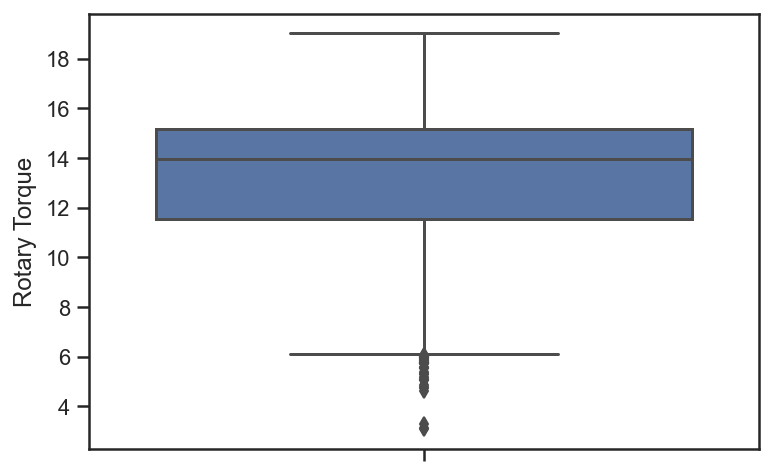

In [55]:
sns.boxplot(y = Data['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

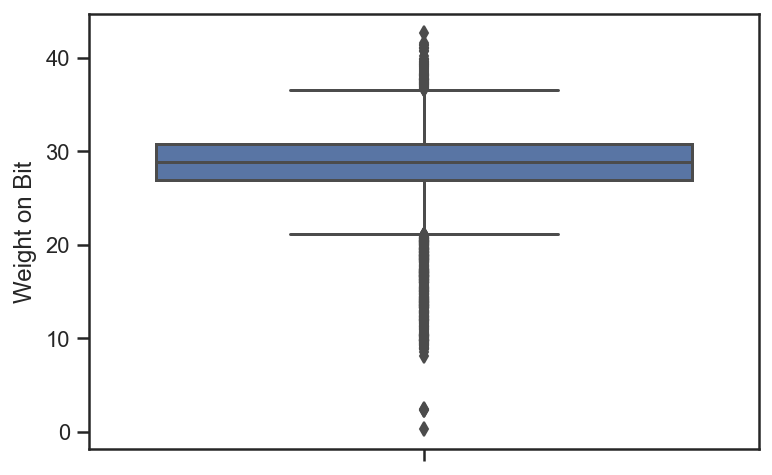

In [56]:
sns.boxplot(y = Data['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

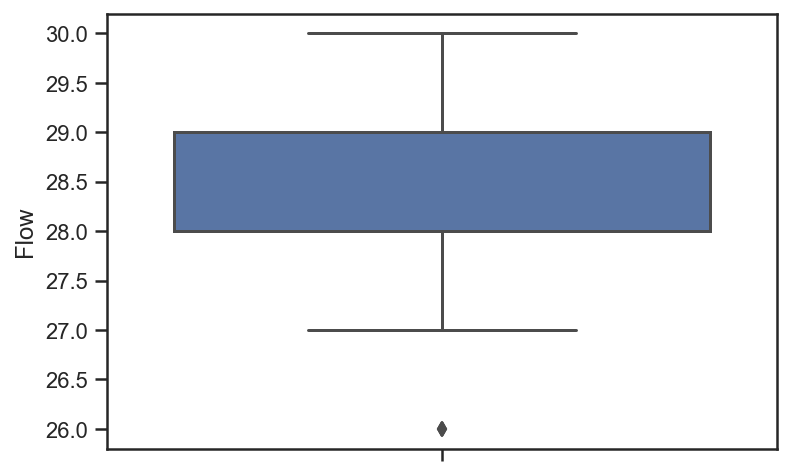

In [57]:
sns.boxplot(y = Data['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

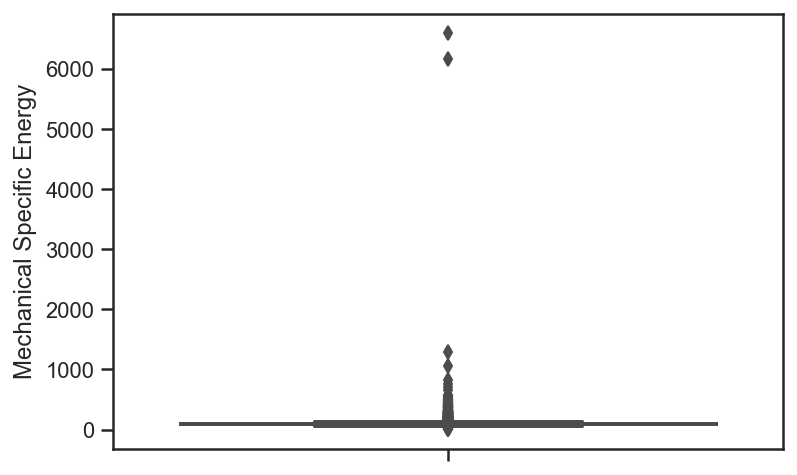

In [58]:
sns.boxplot(y = Data['Mechanical Specific Energy'])

<AxesSubplot:ylabel='RHOB_MODEL'>

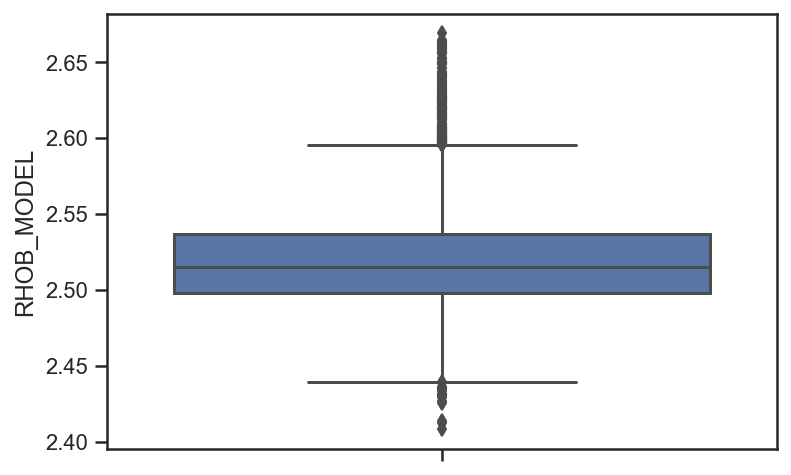

In [59]:
sns.boxplot(y = Data['RHOB_MODEL'])

### Scaling the Data

In [60]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

# Scaling the input data
input_drillingdata = Data[['DEPTH', 'Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow' ]].to_numpy()
drillingdata_scaled = scaler.fit_transform(input_drillingdata)
drillingdata_scaled_df = pd.DataFrame (drillingdata_scaled , columns = ['DEPTH','Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow'])

# Keeping the output data separate
RHOB_raw = Data[['RHOB_MODEL']].to_numpy()
RHOB_raw_df = pd.DataFrame(RHOB_raw, columns = ['RHOB_MODEL'])

drillingdata_scaled_df['RHOB_MODEL'] = RHOB_raw_df

In [71]:
drillingdata_scaled_df.isnull().sum().sum()

0

### Train/Test Split

In [72]:
from sklearn.model_selection import train_test_split
train , test = train_test_split(drillingdata_scaled_df, test_size = 0.15, random_state = 12 )

In [73]:
x_train_1 = train.drop('RHOB_MODEL', axis=1) 
y_train_1 = train['RHOB_MODEL']              

x_test_1 = test.drop('RHOB_MODEL', axis = 1) 
y_test_1 = test['RHOB_MODEL']

In [74]:
print("TRAINING DATA")
print("Size of x_train_1 is:", x_train_1.shape)
print("Size of y_train_1 is:", y_train_1.shape)
print("TEST DATA")
print("Size of x_test_1 is:", x_test_1.shape)
print("Size of y_test_1 is:", y_test_1.shape)

TRAINING DATA
Size of x_train_1 is: (4804, 6)
Size of y_train_1 is: (4804,)
TEST DATA
Size of x_test_1 is: (848, 6)
Size of y_test_1 is: (848,)


### Random Forest Regression

In [75]:
x_train_rf_1 = x_train_1.copy()
x_test_rf_1 = x_test_1.copy()
y_train_rf_1 = y_train_1.copy()
y_test_rf_1 = y_test_1.copy()

In [76]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 

eps = 0.1
rfr= RandomForestRegressor(n_estimators=500, max_depth=10)

rfr.fit(x_train_rf_1, y_train_rf_1)

RandomForestRegressor(max_depth=10, n_estimators=500)

In [77]:
y_pred_rf_1 = rfr.predict(x_test_rf_1)
test_R2 = rfr.score(x_test_rf_1, y_test_rf_1)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf_1 - y_pred_rf_1  < eps) / len(y_test_rf_1)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.36898494670725035
Percentage within Epsilon = 99.17%


Text(0.5, 1.0, 'TestR2 = 0.368985')

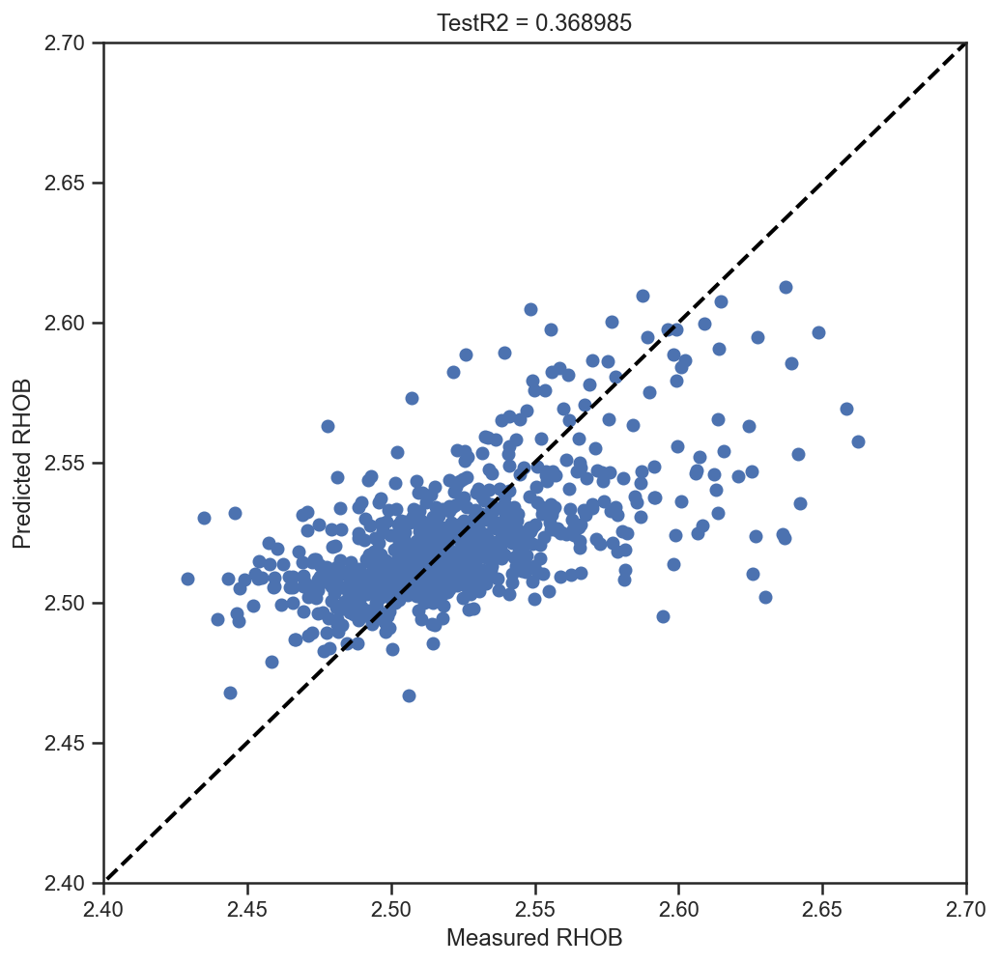

In [78]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_rf_1, y_pred_rf_1)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted RHOB') # Predicted values on y axis
plt.xlabel('Measured RHOB') 
plt.title('TestR2 = %f'%(test_R2))

### Error and Accuracy: Random Forest

In [83]:
NPHI_RandomForest_1 = pd.DataFrame({ 'Measured RHOB':y_test_rf_1, 'Predicted RHOB':y_pred_rf_1})
NPHI_RandomForest_1.head()

,Measured RHOB,Predicted RHOB
5607,2.458347,2.478988
3314,2.492405,2.496133
3495,2.561688,2.581199
2496,2.515505,2.509492
4121,2.518935,2.513718


In [86]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf_1, y_pred_rf_1))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf_1, y_pred_rf_1))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf_1, y_pred_rf_1)))

Mean Absolute Error: 0.02040953223847493
Mean Squared Error: 0.0007898221839575861
Root Mean Squared Error: 0.028103775261654546


In [90]:
# Calculate the absolute errors
errors = abs(y_pred_rf_1 - y_test_rf_1)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf_1)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 99.19 %.


### Variable Importance

In [91]:
# Get numerical feature importances
importances = list(rfr.feature_importances_)

In [92]:
feature_list=list(Data[['DEPTH','Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow']].columns)

feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: DEPTH                Importance: 0.57
Variable: Mechanical Specific Energy Importance: 0.15
Variable: Rate Of Penetration  Importance: 0.1
Variable: Weight on Bit        Importance: 0.09
Variable: Rotary Torque        Importance: 0.08
Variable: Flow                 Importance: 0.01


<AxesSubplot:xlabel='Importance', ylabel='Features'>

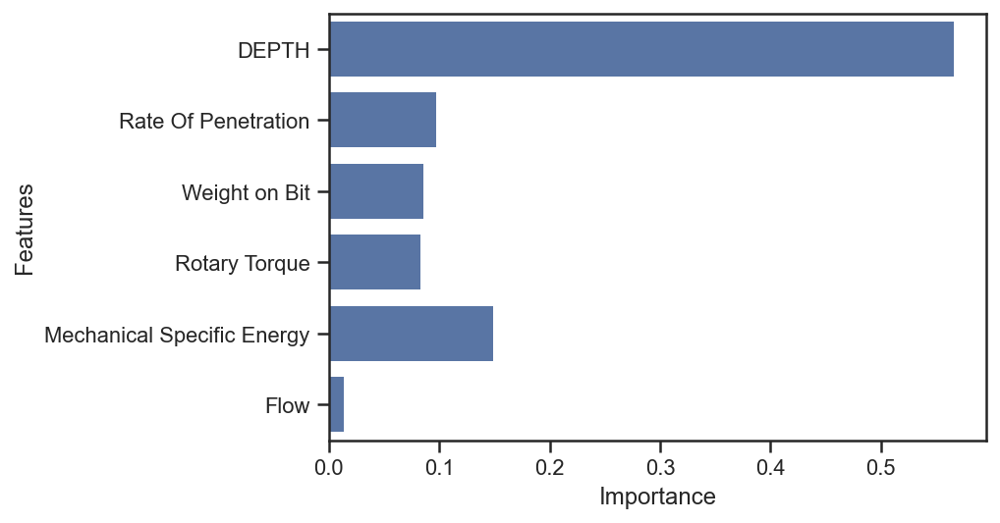

In [93]:
feature_dataframe = pd.DataFrame(data = feature_list, columns = ['Features'])
feature_dataframe['Importance'] = importances

sns.set(style = 'ticks')
sns.barplot(x = 'Importance', y = 'Features', data = feature_dataframe, color="b")


### Scaling the Data: Removing Flow 

In [94]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

# Scaling the input data
input_drillingdata = Data[['DEPTH', 'Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy']].to_numpy()
drillingdata_scaled = scaler.fit_transform(input_drillingdata)
drillingdata_scaled_df = pd.DataFrame (drillingdata_scaled , columns = ['DEPTH','Rate Of Penetration', 'Weight on Bit', 'Rotary Torque','Mechanical Specific Energy'])

# Keeping the output data separate
RHOB_raw = Data[['RHOB_MODEL']].to_numpy()
RHOB_raw_df = pd.DataFrame(RHOB_raw, columns = ['RHOB_MODEL'])

drillingdata_scaled_df['RHOB_MODEL'] = RHOB_raw_df

In [95]:
drillingdata_scaled_df.isnull().sum().sum()

0

### New Train/Test Split

In [96]:
from sklearn.model_selection import train_test_split
train , test = train_test_split(drillingdata_scaled_df, test_size = 0.15, random_state = 12 )

In [97]:
x_train = train.drop('RHOB_MODEL', axis=1) 
y_train = train['RHOB_MODEL']              

x_test = test.drop('RHOB_MODEL', axis = 1) 
y_test = test['RHOB_MODEL']

In [98]:
print("TRAINING DATA")
print("Size of x_train is:", x_train.shape)
print("Size of y_train is:", y_train.shape)
print("TEST DATA")
print("Size of x_test is:", x_test.shape)
print("Size of y_test is:", y_test.shape)

TRAINING DATA
Size of x_train is: (4804, 5)
Size of y_train is: (4804,)
TEST DATA
Size of x_test is: (848, 5)
Size of y_test is: (848,)


### Random Forest Regression

In [99]:
x_train_rf = x_train.copy()
x_test_rf = x_test.copy()
y_train_rf = y_train.copy()
y_test_rf = y_test.copy()

In [100]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 

eps = 0.1
rfr= RandomForestRegressor(n_estimators=500, max_depth=10)

rfr.fit(x_train_rf, y_train_rf)

RandomForestRegressor(max_depth=10, n_estimators=500)

In [101]:
y_pred_rf = rfr.predict(x_test_rf)
test_R2 = rfr.score(x_test_rf, y_test_rf)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf - y_pred_rf  < eps) / len(y_test_rf)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.36941983213567287
Percentage within Epsilon = 99.29%


Text(0.5, 1.0, 'TestR2 = 0.369420')

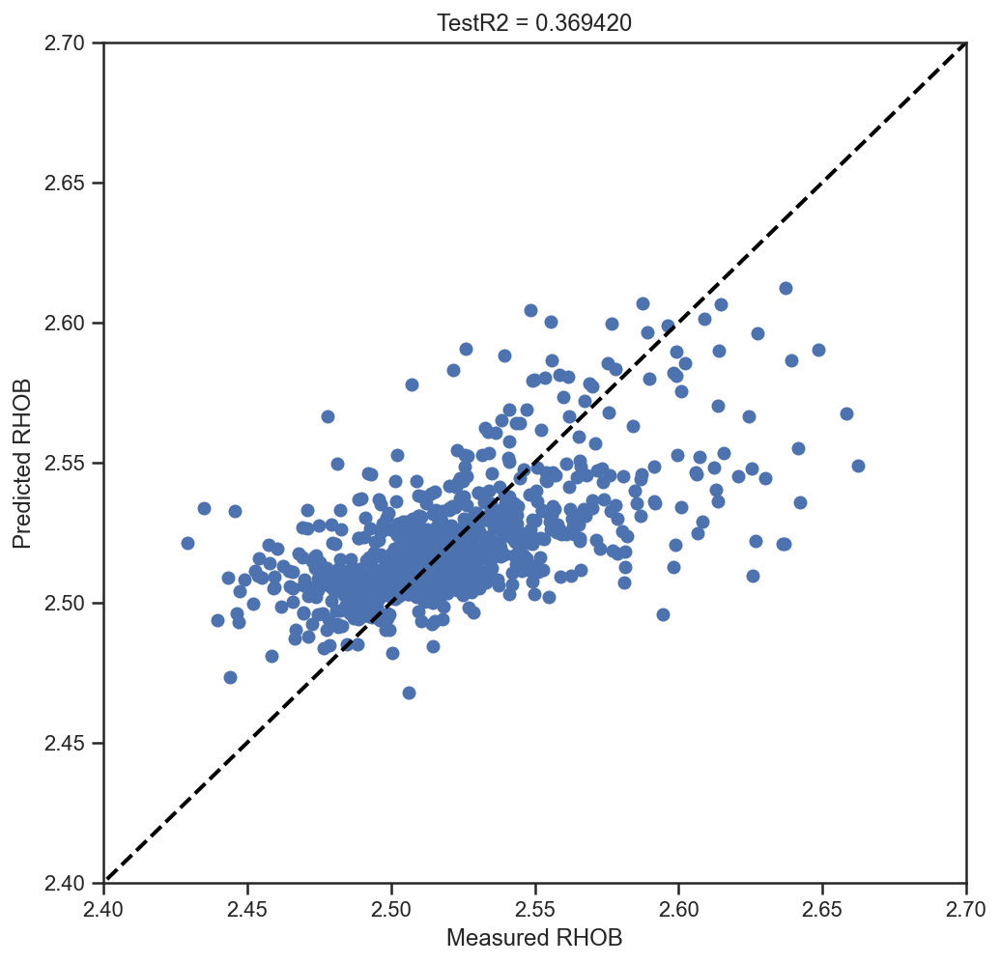

In [102]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_rf, y_pred_rf)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted RHOB') # Predicted values on y axis
plt.xlabel('Measured RHOB') 
plt.title('TestR2 = %f'%(test_R2))

### Error and Accuracy: Random Forest

In [103]:
NPHI_RandomForest = pd.DataFrame({ 'Measured RHOB':y_test_rf, 'Predicted RHOB':y_pred_rf})
NPHI_RandomForest.head()

,Measured RHOB,Predicted RHOB
5607,2.458347,2.481073
3314,2.492405,2.495944
3495,2.561688,2.580497
2496,2.515505,2.510290
4121,2.518935,2.513579


In [104]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf, y_pred_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf, y_pred_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)))

Mean Absolute Error: 0.020406526060306702
Mean Squared Error: 0.0007892778512082236
Root Mean Squared Error: 0.028094089257497273


In [105]:
# Calculate the absolute errors
errors = abs(y_pred_rf - y_test_rf)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 99.19 %.


### Hyperparameter optimization for the RF

In [106]:
from sklearn.model_selection import KFold

cv = KFold(n_splits=10, shuffle = True, random_state=125)

In [107]:
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators': [200, 500, 1000], 'max_depth': [3,4,5], 'min_samples_split': [5,10,15]} # dictionary with keys

grid = GridSearchCV(rfr, param_grid=param_grid, cv=cv, verbose=3) 

In [108]:
grid.fit(x_train_rf, y_train_rf)

Fitting 10 folds for each of 27 candidates, totalling 270 fits
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.129, total=   0.6s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.070, total=   0.6s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.3s remaining:    0.0s


[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.130, total=   0.6s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.130, total=   0.6s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.133, total=   0.6s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.068, total=   0.6s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.099, total=   0.6s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.118, total=   0.6s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=

[CV]  max_depth=3, min_samples_split=10, n_estimators=1000, score=0.073, total=   3.1s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=1000, score=0.098, total=   3.1s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=1000, score=0.118, total=   3.1s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=1000, score=0.111, total=   3.1s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=1000, score=0.134, total=   3.1s
[CV] max_depth=3, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=3, min_samples_split=15, n_estimators=200, score=0.133, total=   0.6s
[CV] max_depth=3, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=3, min_samples_split=15, n_estimators

[CV]  max_depth=4, min_samples_split=5, n_estimators=500, score=0.192, total=   1.9s
[CV] max_depth=4, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=4, min_samples_split=5, n_estimators=500, score=0.217, total=   1.9s
[CV] max_depth=4, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=4, min_samples_split=5, n_estimators=1000, score=0.194, total=   3.8s
[CV] max_depth=4, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=4, min_samples_split=5, n_estimators=1000, score=0.166, total=   3.8s
[CV] max_depth=4, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=4, min_samples_split=5, n_estimators=1000, score=0.193, total=   3.8s
[CV] max_depth=4, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=4, min_samples_split=5, n_estimators=1000, score=0.214, total=   3.8s
[CV] max_depth=4, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=4, min_samples_split=5, n_estimators=1000, s

[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.166, total=   2.0s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.190, total=   2.0s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.216, total=   2.0s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.227, total=   2.0s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.134, total=   2.0s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.145, total=   2.0s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500,

[CV]  max_depth=5, min_samples_split=10, n_estimators=200, score=0.280, total=   1.0s
[CV] max_depth=5, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=10, n_estimators=200, score=0.174, total=   1.0s
[CV] max_depth=5, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=10, n_estimators=200, score=0.206, total=   1.0s
[CV] max_depth=5, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=10, n_estimators=200, score=0.224, total=   1.0s
[CV] max_depth=5, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=10, n_estimators=200, score=0.242, total=   1.0s
[CV] max_depth=5, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=10, n_estimators=200, score=0.272, total=   1.0s
[CV] max_depth=5, min_samples_split=10, n_estimators=500 .............
[CV]  max_depth=5, min_samples_split=10, n_estimators=500,

[CV]  max_depth=5, min_samples_split=15, n_estimators=1000, score=0.224, total=   5.1s
[CV] max_depth=5, min_samples_split=15, n_estimators=1000 ............
[CV]  max_depth=5, min_samples_split=15, n_estimators=1000, score=0.242, total=   5.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=1000 ............
[CV]  max_depth=5, min_samples_split=15, n_estimators=1000, score=0.272, total=   5.2s


[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed: 10.3min finished


GridSearchCV(cv=KFold(n_splits=10, random_state=125, shuffle=True),
             estimator=RandomForestRegressor(max_depth=10, n_estimators=500),
             param_grid={'max_depth': [3, 4, 5],
                         'min_samples_split': [5, 10, 15],
                         'n_estimators': [200, 500, 1000]},
             verbose=3)

In [109]:
print(grid.best_params_) 
print("score", grid.score(x_test_rf,y_test_rf)) 

{'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 1000}
score 0.2245417556887962


In [110]:
import pandas as pd

cv_results = pd.DataFrame(grid.cv_results_)

# generate a subset of the table
cv_results_tiny = cv_results[['param_max_depth', 'param_min_samples_split', 'mean_test_score','std_test_score']]

# rank them based on test scores
cv_results_tiny.sort_values(by='mean_test_score', ascending=False).head(5)

,param_max_depth,param_min_samples_split,mean_test_score,std_test_score
20,5,5,0.237709,0.029669
18,5,5,0.237364,0.031372
19,5,5,0.237232,0.029496
26,5,15,0.236088,0.029820
23,5,10,0.235908,0.029495


## Reapply the RF with optimal parameters again

In [171]:
grid_new=grid.best_estimator_

In [172]:
print('memorization performance: ', grid_new.score(x_train_rf,y_train_rf)) # memorization

print('generalization performance: ', grid_new.score(x_test_rf,y_test_rf))  # generalization

memorization performance:  0.2932197215422119
generalization performance:  0.2245417556887962


In [173]:
y_pred_rfop = grid_new.predict(x_test_rf)

In [174]:
y_pred_rfop = rfr.predict(x_test_rf)
test_R2 = rfr.score(x_test_rf, y_test_rf)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf - y_pred_rfop  < eps) / len(y_test_rf)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.36941983213567287
Percentage within Epsilon = 99.29%


Text(0.5, 1.0, 'TestR2 = 0.369420')

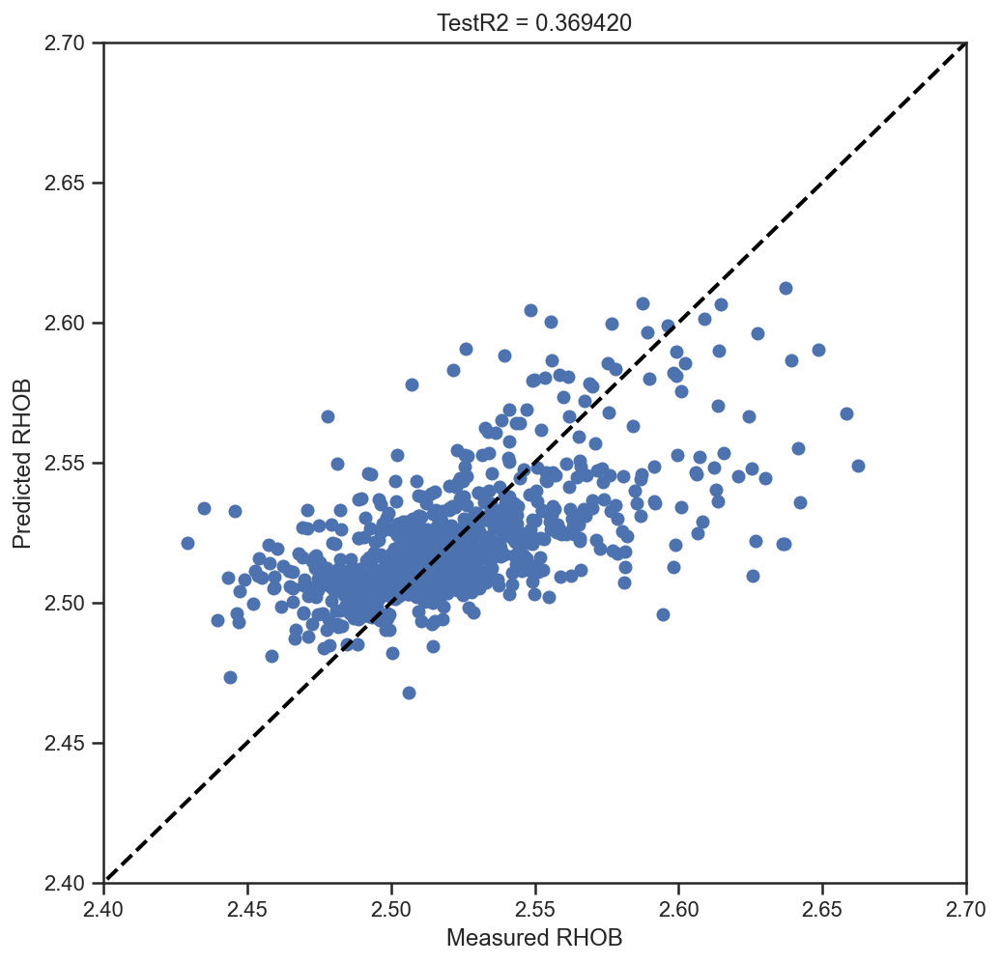

In [175]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_rf, y_pred_rfop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted RHOB') # Predicted values on y axis
plt.xlabel('Measured RHOB') 
plt.title('TestR2 = %f'%(test_R2))

In [115]:
NPHI_RandomForest_OP = pd.DataFrame({'Measured RHOB':y_test_rf, 'Predicted RHOB':y_pred_rfop})
NPHI_RandomForest_OP.head()

,Measured RHOB,Predicted RHOB
5607,2.458347,2.486634
3314,2.492405,2.501091
3495,2.561688,2.571465
2496,2.515505,2.511727
4121,2.518935,2.518598


In [116]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf, y_pred_rfop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf, y_pred_rfop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rfop)))

Mean Absolute Error: 0.02263268357448987
Mean Squared Error: 0.0009706172949342343
Root Mean Squared Error: 0.031154731501559025


In [117]:
# Calculate the absolute errors
errors = abs(y_pred_rfop - y_test_rf)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 99.11 %.


### KNN Regression with K Neighbors

In [118]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

from sklearn import neighbors
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [119]:
x_train_knn = x_train.copy()
x_test_knn = x_test.copy()
y_train_knn = y_train.copy()
y_test_knn = y_test.copy()

<ipython-input-120-8de4d717546f>:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(K, figsize=(6, 6))


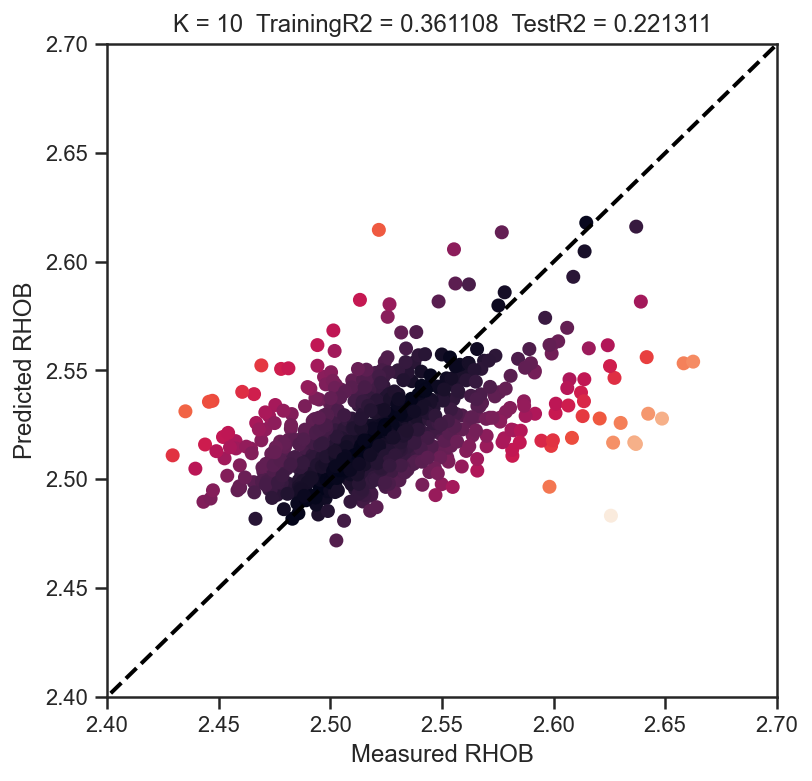

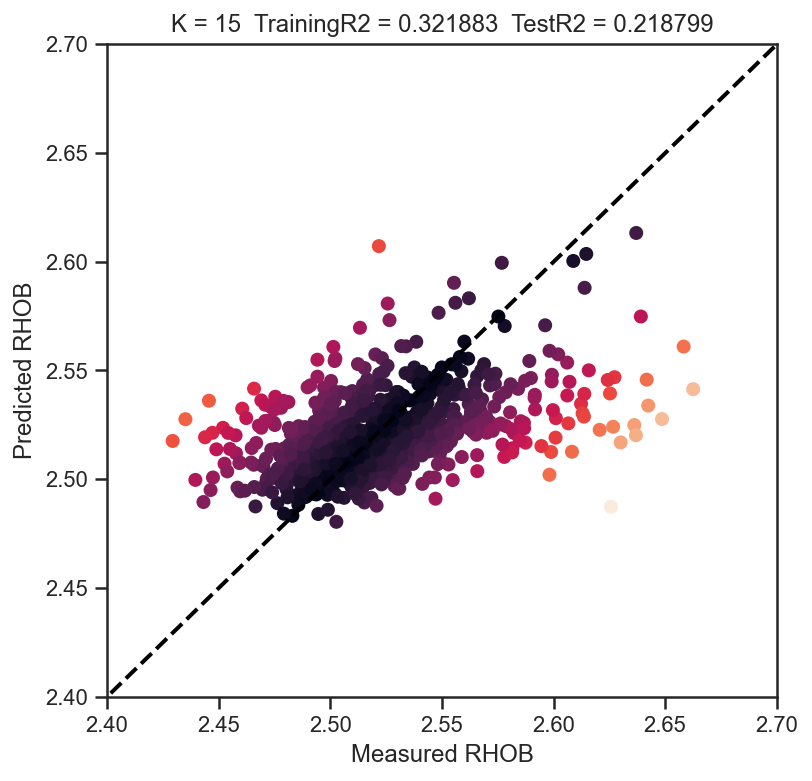

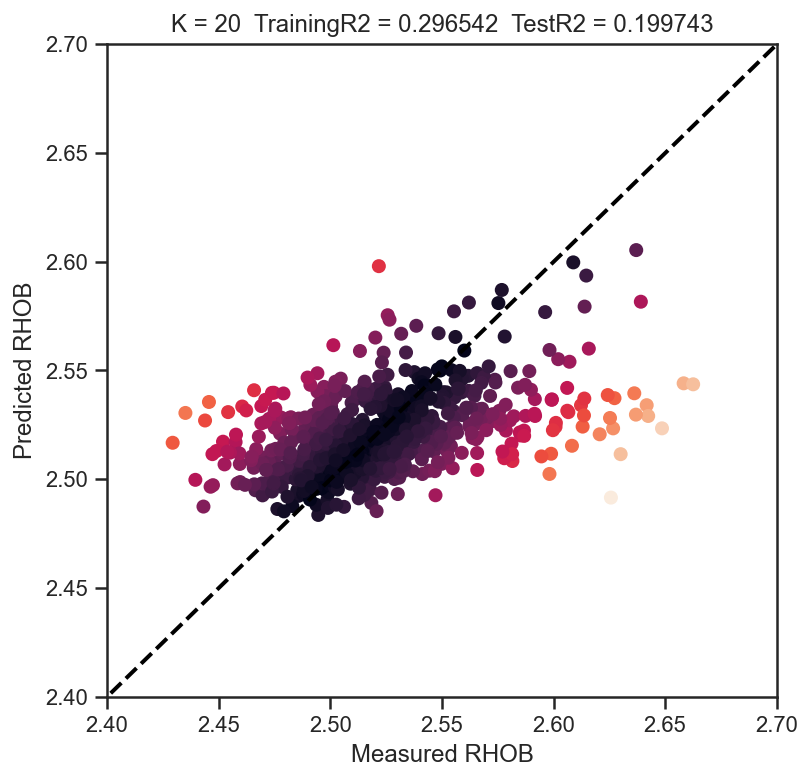

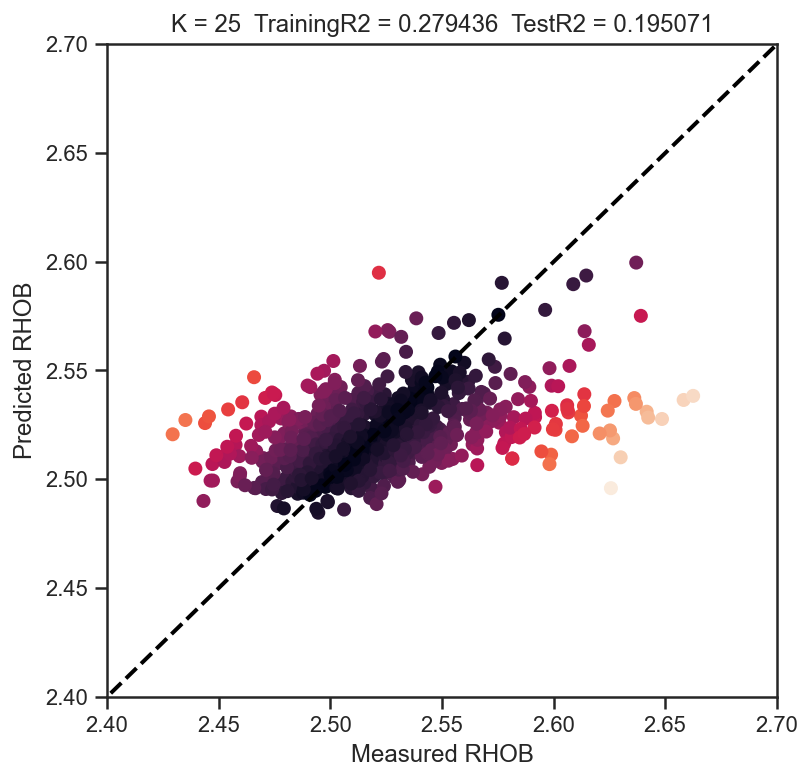

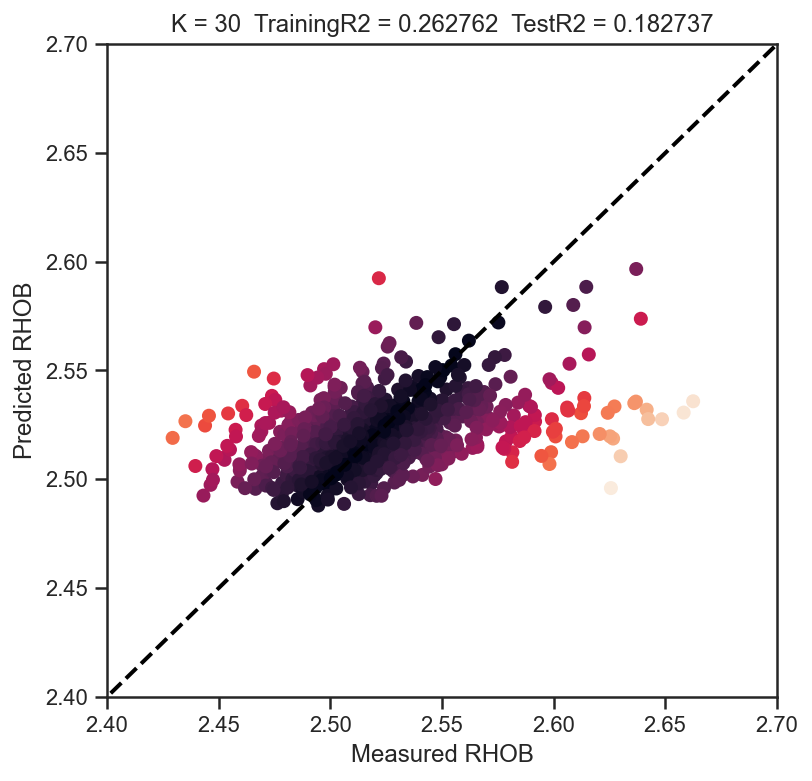

...

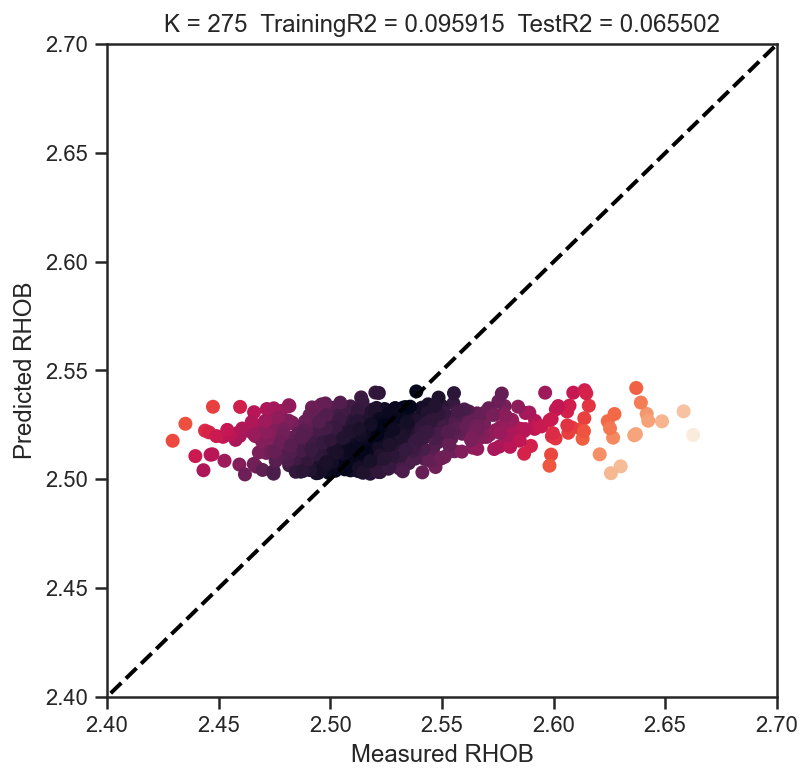

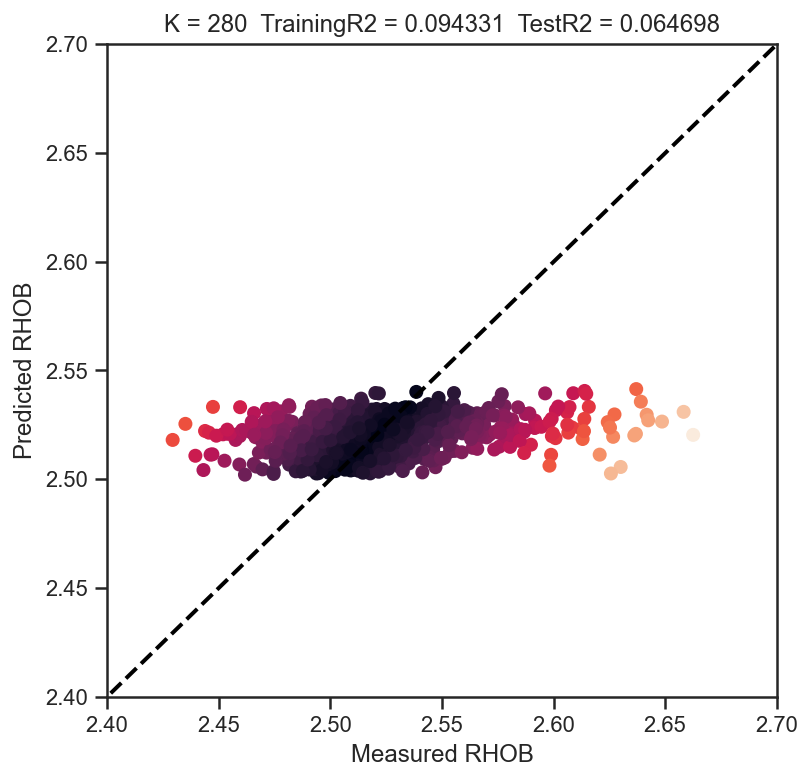

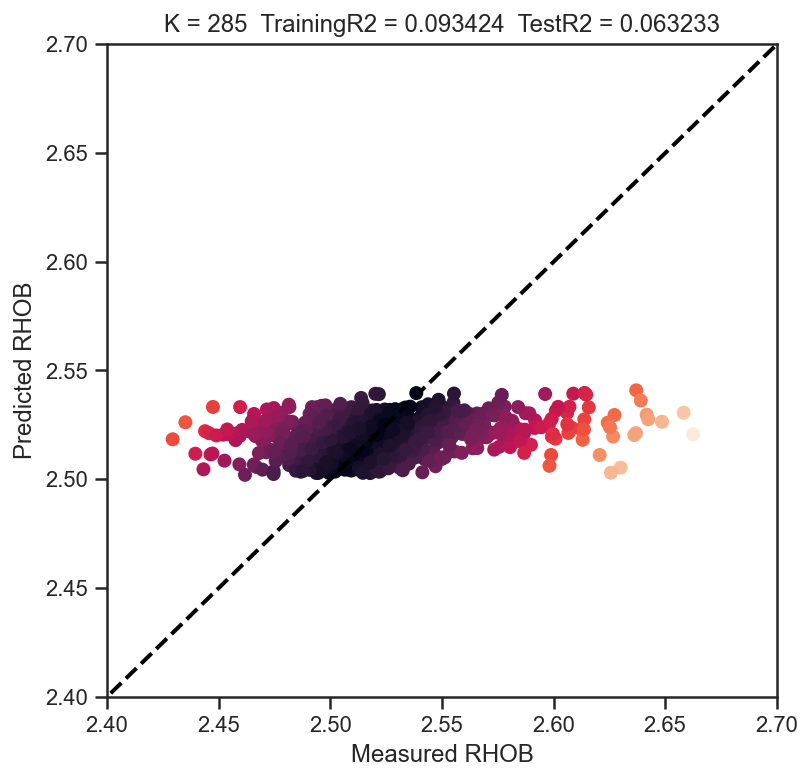

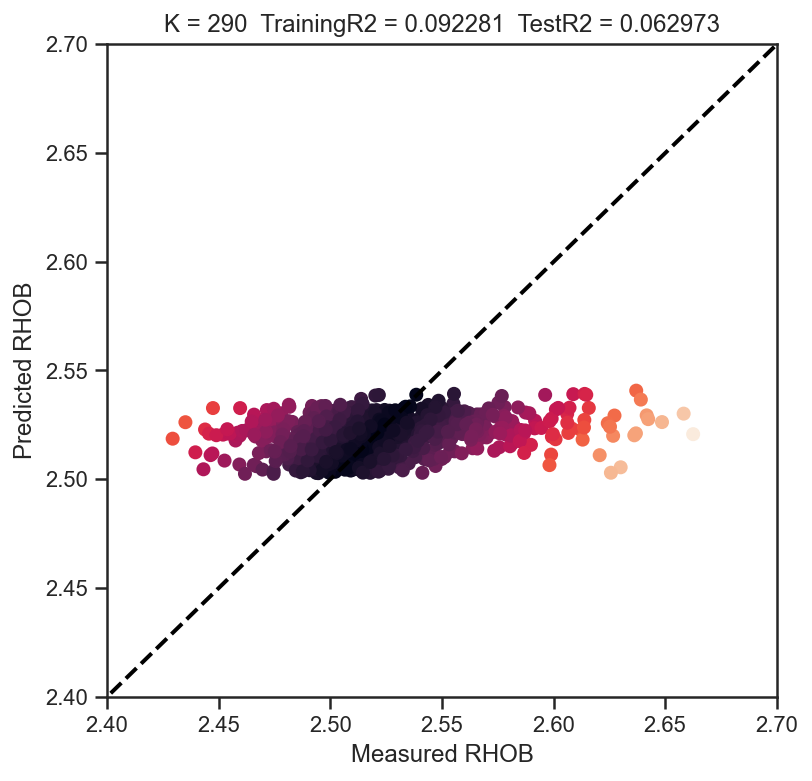

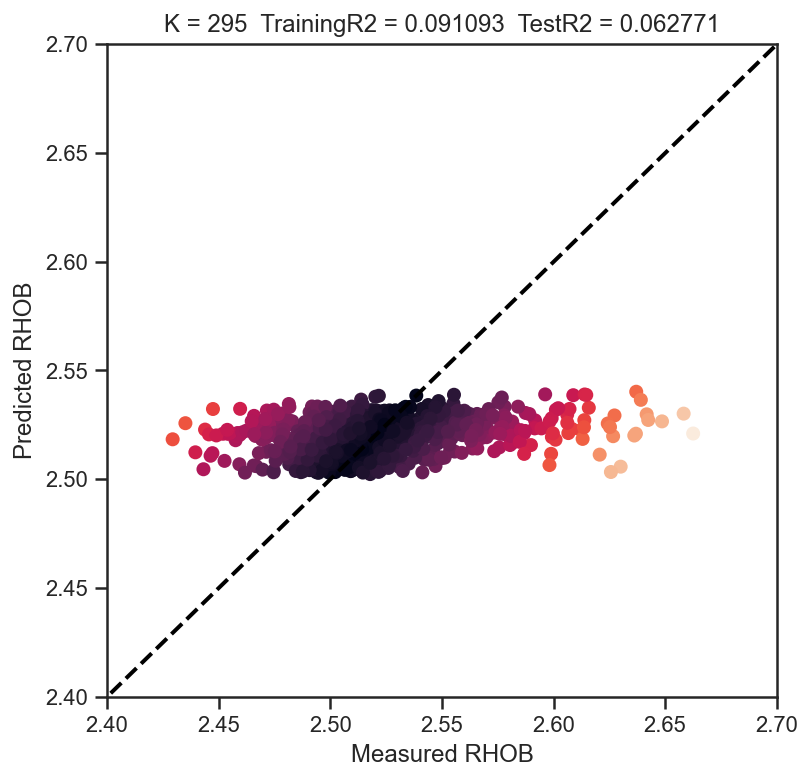

In [120]:
#import required packages
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
from math import sqrt


rmse_val = [] # To store rmse values for different k
k_val = []    # To store values of K
R2 = []       # To store R2

for K in range(10, 300, 5):

    k_val.append(K)
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(x_train_knn, y_train_knn)  # fit the model
    y_pred_knn = model.predict(x_test_knn) # make prediction on test set
    
    training_R2 = model.score(x_train_knn, y_train_knn) # Compute training R2
    test_R2 = model.score(x_test_knn, y_test_knn)       # Compute test R2
    R2.append(test_R2)
    
    error = sqrt(mean_squared_error(y_test_knn, y_pred_knn)) #calculate rmse
    rmse_val.append(error)                         #store rmse values
    er=abs(y_test_knn - y_pred_knn)  
   
    # Also create a series of plots for predicted versus actual DT for different values of K
    fig = plt.figure(K, figsize=(6, 6))
    plt.axis([2.4, 2.7, 2.4, 2.7])
    plt.scatter(y_test_knn, y_pred_knn, c = er)
    plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
    plt.ylabel('Predicted RHOB') # Predicted values on y axis
    plt.xlabel('Measured RHOB') 
    plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%(K, training_R2, test_R2))



### Finding Optimal Value of K

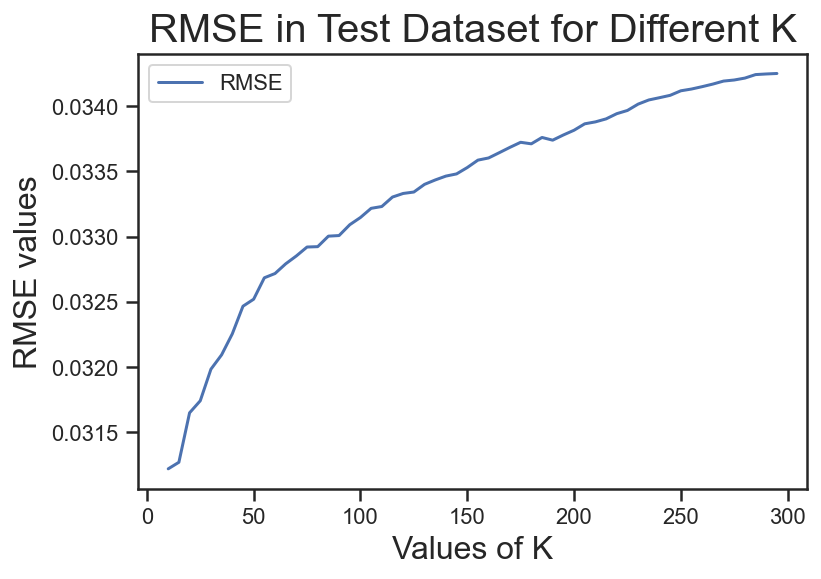

In [121]:
#plotting the rmse values against k values
plt.plot(k_val, rmse_val, label = 'RMSE')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('RMSE values', fontsize = 16)
plt.title ('RMSE in Test Dataset for Different K', fontsize = 20)
plt.legend()

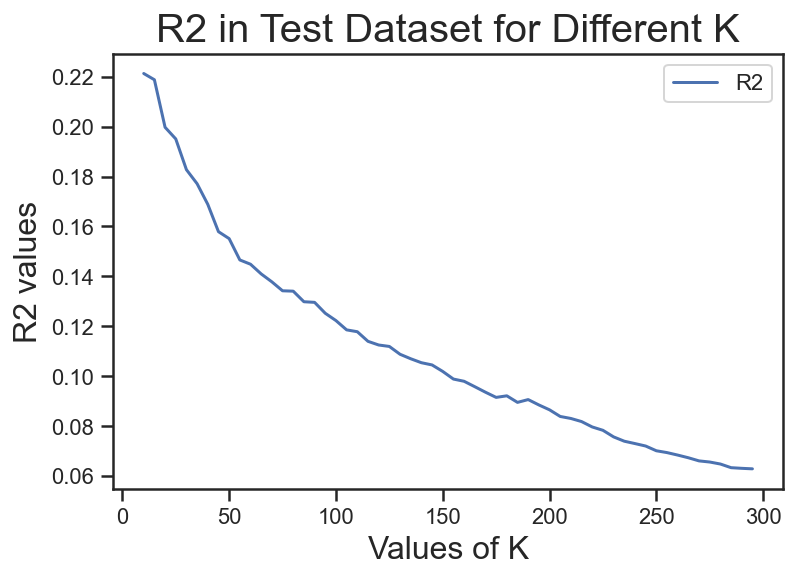

In [122]:
#plotting the rmse values against k values
plt.plot(k_val, R2, label = 'R2')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('R2 values', fontsize = 16)
plt.title ('R2 in Test Dataset for Different K', fontsize = 20)
plt.legend()

### Using Optimal Value of K

Text(0.5, 1.0, 'K = 10  TrainingR2 = 0.361108  TestR2 = 0.221311')

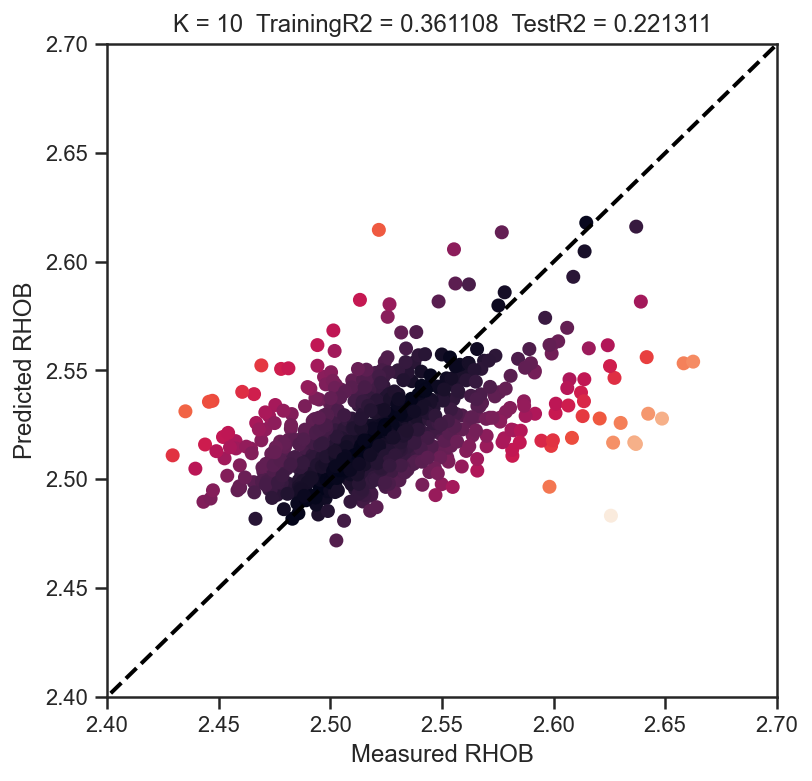

In [176]:
K = 10

model = neighbors.KNeighborsRegressor(n_neighbors = K)

model.fit(x_train_knn, y_train_knn)  # fit the model
y_pred_knn = model.predict(x_test_knn) # make prediction on test set
    
training_R2 = model.score(x_train_knn, y_train_knn) # Compute training R2
test_R2 = model.score(x_test_knn, y_test_knn)       # Compute test R2
R2.append(test_R2)
    
error = sqrt(mean_squared_error(y_test_knn, y_pred_knn)) #calculate rmse
rmse_val.append(error)                         #store rmse values
er=abs(y_test_knn - y_pred_knn)  
   
# Also create a series of plots for predicted versus actual DT for different values of K
fig = plt.figure(K, figsize=(6, 6))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_knn, y_pred_knn, c = er)
plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
plt.ylabel('Predicted RHOB') # Predicted values on y axis
plt.xlabel('Measured RHOB') 
plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%(K, training_R2, test_R2))

In [124]:
NPHI_KNN = pd.DataFrame({'Measured RHOB':y_test_knn, 'Predicted RHOB':y_pred_knn})
NPHI_KNN.head()

,Measured RHOB,Predicted RHOB
5607,2.458347,2.494902
3314,2.492405,2.506983
3495,2.561688,2.553405
2496,2.515505,2.505818
4121,2.518935,2.510319


In [125]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_knn, y_pred_knn))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_knn, y_pred_knn))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_knn, y_pred_knn)))

Mean Absolute Error: 0.022888157900943385
Mean Squared Error: 0.0009746605983966155
Root Mean Squared Error: 0.031219554743727777


In [126]:
# Calculate the absolute errors
errors = abs(y_pred_knn - y_test_knn)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_knn)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 99.1 %.


### Linear Regression

In [127]:
x_train_lr = x_train.copy()
x_test_lr = x_test.copy()
y_train_lr = y_train.copy()
y_test_lr = y_test.copy()

In [128]:
from sklearn.linear_model import LinearRegression
clf = LinearRegression()
clf.fit(x_train_lr, y_train_lr)

LinearRegression()

In [129]:
y_pred_lr = clf.predict(x_test_lr)

Text(0.5, 0, 'Measured RHOB')

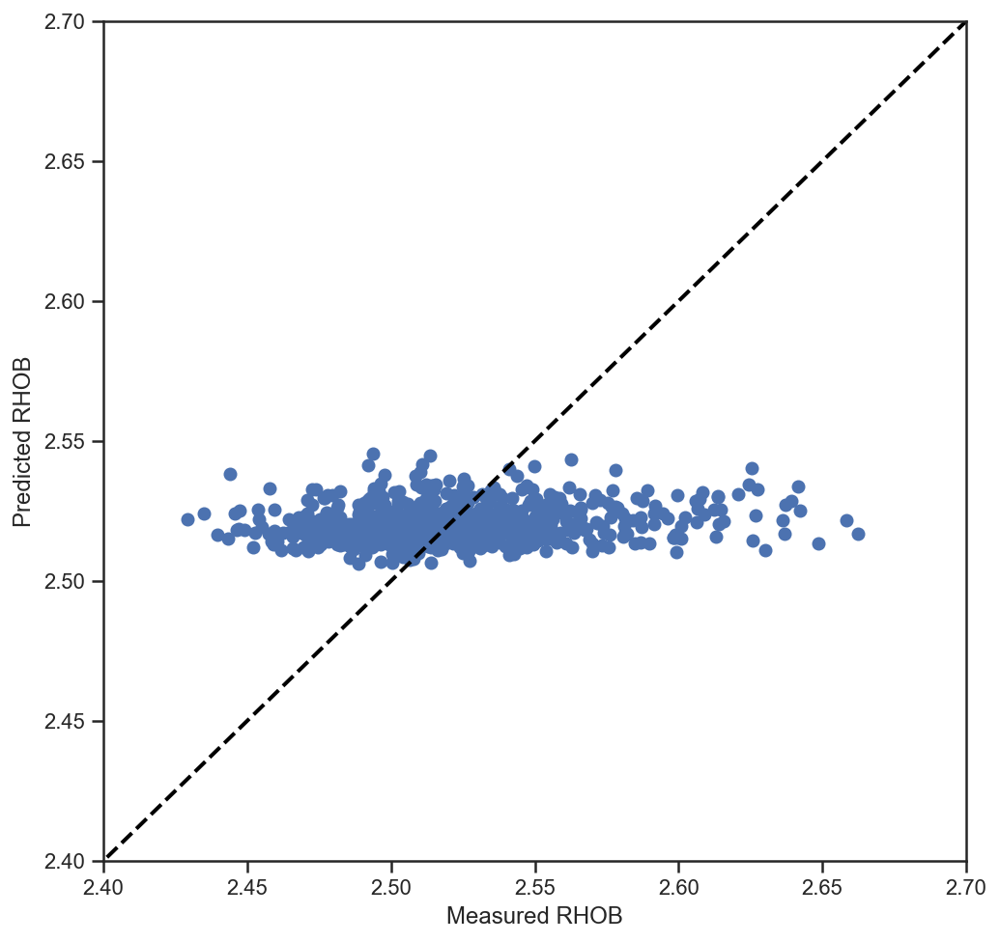

In [130]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_lr, y_pred_lr)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted RHOB') # Predicted values on y axis
plt.xlabel('Measured RHOB') 


In [131]:
NPHI_LinearRegression = pd.DataFrame({'Measured RHOB':y_test_lr, 'Predicted RHOB':y_pred_lr})
NPHI_LinearRegression.head()

,Measured RHOB,Predicted RHOB
5607,2.458347,2.513939
3314,2.492405,2.512959
3495,2.561688,2.518021
2496,2.515505,2.513680
4121,2.518935,2.519023


In [132]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_lr, y_pred_lr))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_lr, y_pred_lr))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_lr, y_pred_lr)))

Mean Absolute Error: 0.025804696135434523
Mean Squared Error: 0.0012173847448908274
Root Mean Squared Error: 0.03489104104051393


In [133]:
# Calculate the absolute errors
errors = abs(y_pred_lr - y_test_lr)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_lr)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.03 degrees.
Accuracy: 98.98 %.


### Support Vector Regression

In [134]:
x_train_svm = x_train.copy()
x_test_svm = x_test.copy()
y_train_svm = y_train.copy()
y_test_svm = y_test.copy()

In [135]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
regressor = SVR(kernel = 'rbf')

regressor.fit(x_train_svm, y_train_svm)

SVR()

In [136]:
y_pred_svm = regressor.predict(x_test_svm) 

Text(0.5, 0, 'Measured RHOB')

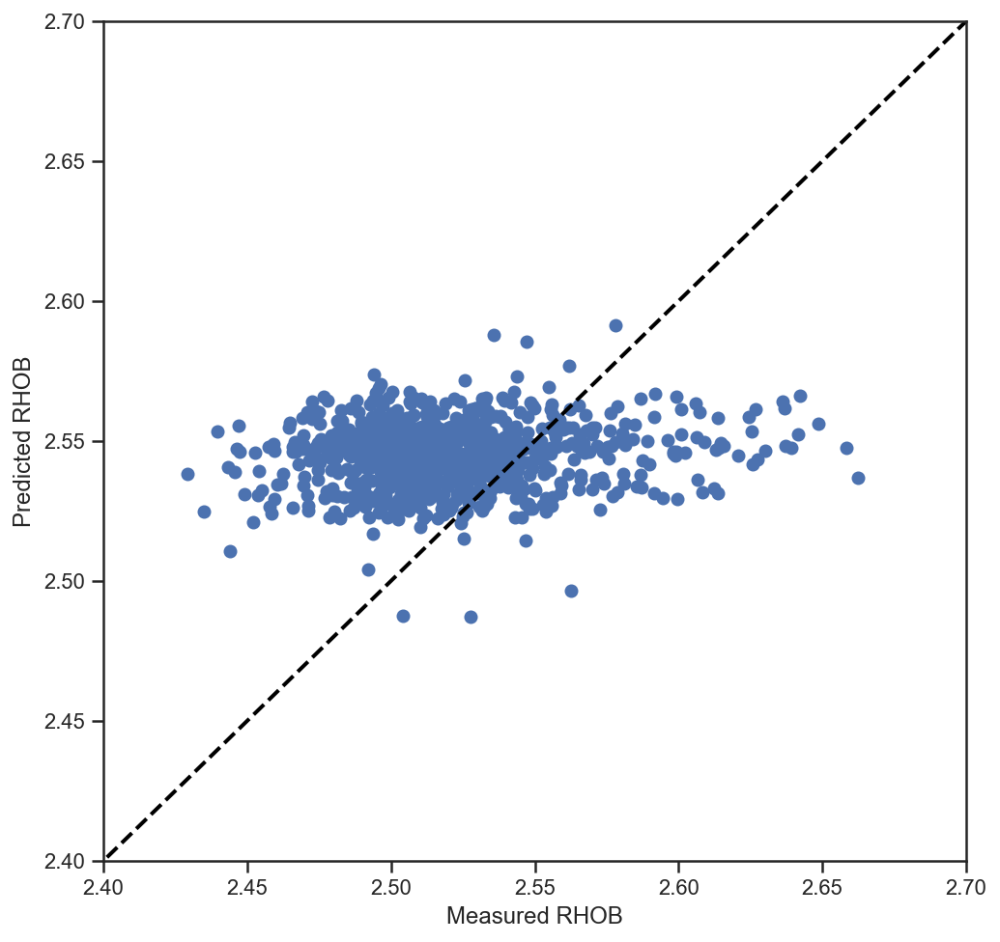

In [137]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_svm, y_pred_svm)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted RHOB') # Predicted values on y axis
plt.xlabel('Measured RHOB') 


In [138]:
NPHI_svm = pd.DataFrame({'Measured RHOB':y_test_svm, 'Predicted RHOB':y_pred_svm})
NPHI_svm.head()

,Measured RHOB,Predicted RHOB
5607,2.458347,2.523957
3314,2.492405,2.545550
3495,2.561688,2.538050
2496,2.515505,2.548743
4121,2.518935,2.544625


In [139]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_svm, y_pred_svm))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_svm, y_pred_svm))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_svm, y_pred_svm)))

Mean Absolute Error: 0.036123011864479006
Mean Squared Error: 0.001855520589752113
Root Mean Squared Error: 0.043075754082222556


In [140]:
# Calculate the absolute errors
errors = abs(y_pred_svm - y_test_svm)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_svm)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.04 degrees.
Accuracy: 98.56 %.


### Hyperparameter Optimization for the SVR

In [141]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
grid_svr = GridSearchCV(
        estimator=SVR(kernel='rbf'),
        param_grid={
            'C': [0.1, 100],
            'epsilon': [0.001, 1],
            'gamma': [0.001,10],
            'kernel': ['rbf']
        },
        cv=10, verbose=0)

In [142]:
grid_svr.fit(x_train_svm, y_train_svm)

GridSearchCV(cv=10, estimator=SVR(),
             param_grid={'C': [0.1, 100], 'epsilon': [0.001, 1],
                         'gamma': [0.001, 10], 'kernel': ['rbf']})

In [143]:
print("Score on test set: %f" % grid.score(x_test_svm, y_test_svm))
print("Best parameters: %s" % grid.best_params_)

Score on test set: 0.224542
Best parameters: {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 1000}


In [144]:
cv_results = pd.DataFrame(grid_svr.cv_results_)
cv_results_tiny = cv_results[['param_C', 'mean_test_score']]
cv_results_tiny.sort_values(by='mean_test_score', ascending=False).head(5)

,param_C,mean_test_score
1,0.1,0.085022
4,100,0.003986
0,0.1,-0.012054
5,100,-0.137369
2,0.1,-0.300203


### Reapply the SVR with Optimal Parameters again 

In [145]:
grid_svr_new=grid.best_estimator_

In [146]:
print('memorization performance: ', grid_svr_new.score(x_train_svm,y_train_svm)) # memorization

print('generalization performance: ', grid_svr_new.score(x_test_svm,y_test_svm))  # generalization

memorization performance:  0.2932197215422119
generalization performance:  0.2245417556887962


In [147]:
y_pred_svmop = grid_svr_new.predict(x_test_svm)

Text(0.5, 0, 'Measured RHOB')

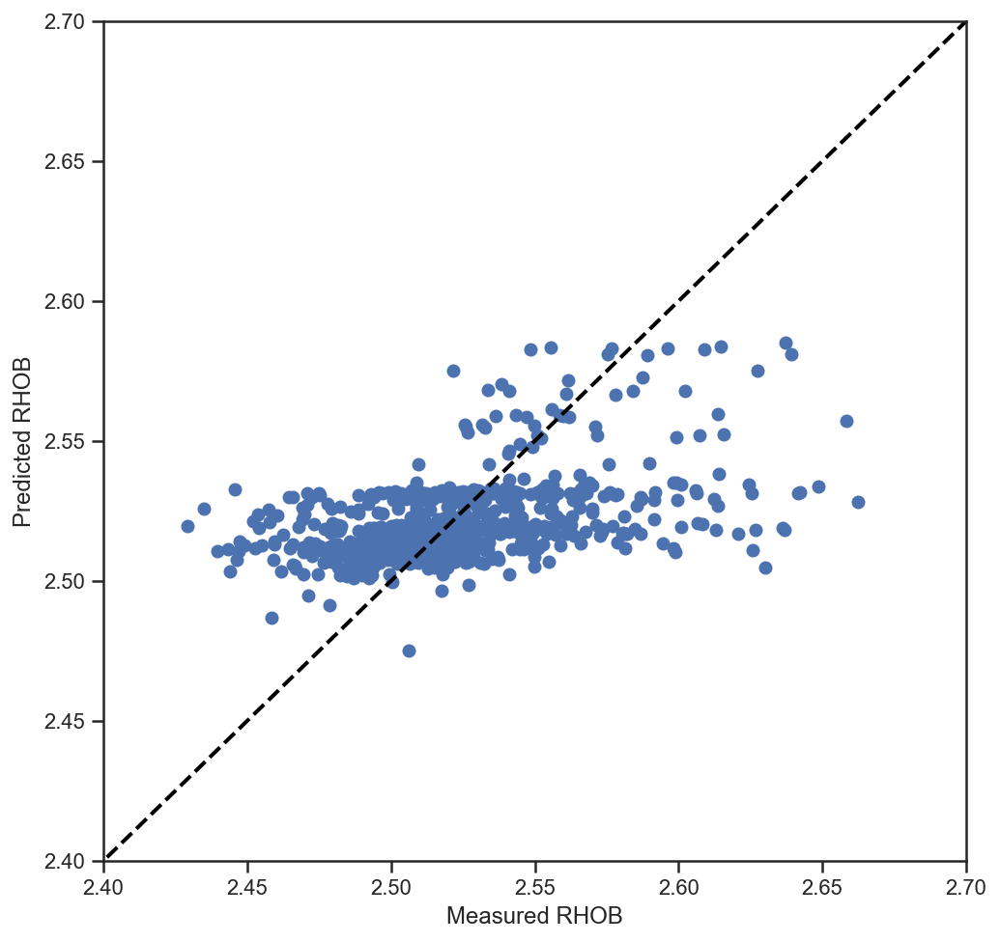

In [148]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_svm, y_pred_svmop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted RHOB') # Predicted values on y axis
plt.xlabel('Measured RHOB') 

In [149]:
NPHI_svm_OP = pd.DataFrame({'Measured RHOB':y_test_svm, 'Predicted RHOB':y_pred_svmop})
NPHI_svm_OP.head()

,Measured RHOB,Predicted RHOB
5607,2.458347,2.486634
3314,2.492405,2.501091
3495,2.561688,2.571465
2496,2.515505,2.511727
4121,2.518935,2.518598


In [150]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_svm, y_pred_svmop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_svm, y_pred_svmop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_svm, y_pred_svmop)))

Mean Absolute Error: 0.02263268357448987
Mean Squared Error: 0.0009706172949342343
Root Mean Squared Error: 0.031154731501559025


In [151]:
# Calculate the absolute errors
errors = abs(y_pred_svmop - y_test_svm)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_svm)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.02 degrees.
Accuracy: 99.11 %.


### MLP Regression

In [152]:
x_train_mlp = x_train.copy()
x_test_mlp = x_test.copy()
y_train_mlp = y_train.copy()
y_test_mlp = y_test.copy()

In [153]:
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor
nn_rgr = rgr = MLPRegressor(hidden_layer_sizes = (15, 45, 25, 100), random_state=1, max_iter=300)

nn_rgr.fit(x_train_mlp,y_train_mlp)

MLPRegressor(hidden_layer_sizes=(15, 45, 25, 100), max_iter=300, random_state=1)

In [154]:
y_pred_mlp = nn_rgr.predict(x_test_mlp)

Text(0.5, 0, 'Measured RHOB')

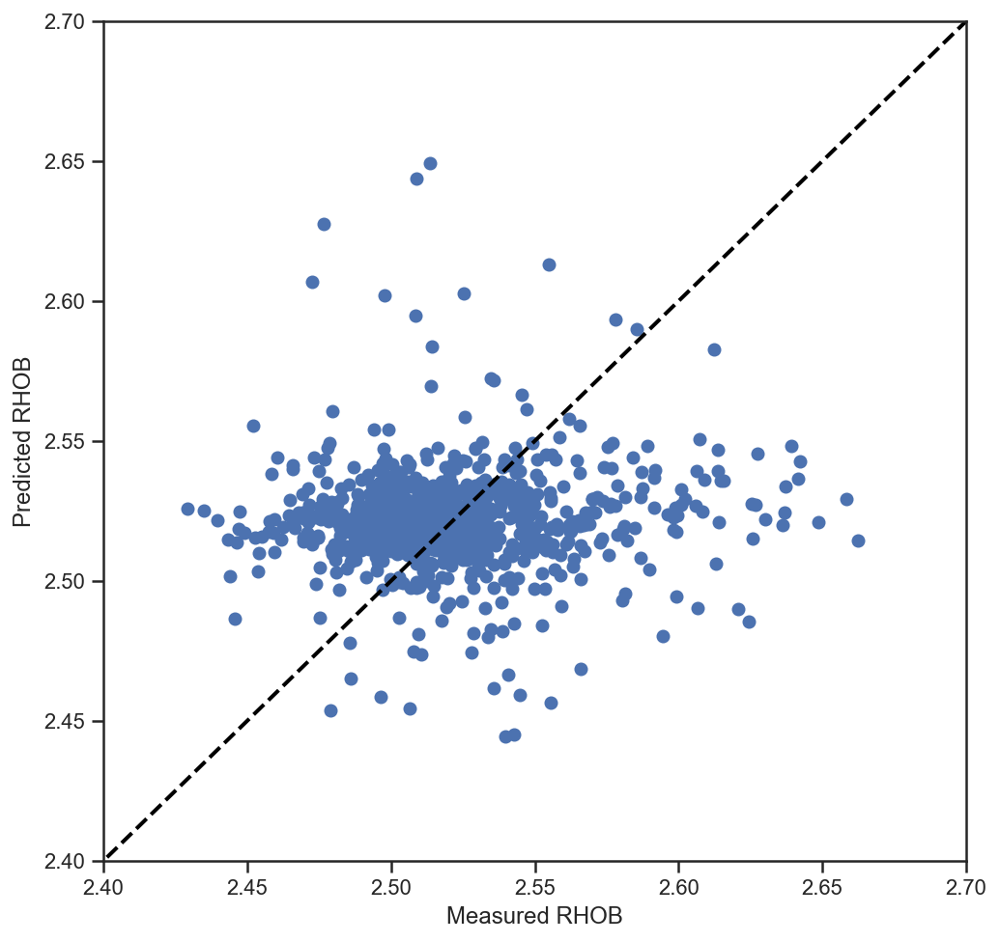

In [155]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_mlp, y_pred_mlp)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted RHOB') # Predicted values on y axis
plt.xlabel('Measured RHOB') 

In [156]:
NPHI_mlp= pd.DataFrame({'Measured RHOB':y_test_mlp, 'Predicted RHOB':y_pred_mlp})
NPHI_mlp.head()

,Measured RHOB,Predicted RHOB
5607,2.458347,2.538164
3314,2.492405,2.512376
3495,2.561688,2.513984
2496,2.515505,2.519909
4121,2.518935,2.531063


In [157]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_mlp, y_pred_mlp))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_mlp, y_pred_mlp))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_mlp, y_pred_mlp)))

Mean Absolute Error: 0.029055140540735956
Mean Squared Error: 0.0015924834012533888
Root Mean Squared Error: 0.03990593190558753


In [158]:
# Calculate the absolute errors
errors = abs(y_pred_mlp - y_test_mlp)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_mlp)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.03 degrees.
Accuracy: 98.85 %.


### Hyperparameter Optimization using MLP

In [159]:
import itertools   

In [160]:
%%time

params = {'activation': ['relu', 'tanh', 'logistic', 'identity'],
          'hidden_layer_sizes': list(itertools.permutations([50,100,150],2)) + list(itertools.permutations([50,100,150],3)) + [50,100,150],
          'solver': ['adam', 'lbfgs'],
          'learning_rate' : ['constant', 'adaptive', 'invscaling']
         }

mlp_regressor_grid = GridSearchCV(MLPRegressor(random_state=123), param_grid=params, cv=5, verbose=5)

CPU times: user 212 µs, sys: 73 µs, total: 285 µs
Wall time: 54.1 µs


In [161]:
grid_mlp = mlp_regressor_grid.fit(x_train_mlp,y_train_mlp)

Fitting 5 folds for each of 360 candidates, totalling 1800 fits
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.642, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.063, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.3s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.059, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.015, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.6s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.042, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.007, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.031, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=-0.011, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.037, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100

[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.063, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=-0.013, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=-0.023, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=-0.035, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.022, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 1

[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=0.014, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.014, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.022, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=-0.000, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.026, total=   0.3s
[CV] activation=relu, hidden_lay

[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-0.020, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.021, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.024, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.038, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.013, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 50), 

[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.054, total=   1.3s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-0.008, total=   1.4s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.029, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.027, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=-0.007, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(

[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-0.009, total=   1.9s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.025, total=   1.7s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-0.004, total=   1.9s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=-0.020, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.023, tot

[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.413, total=   1.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.044, total=   1.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.025, total=   1.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.069, total=   1.6s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.046, total=   1.7s
[CV] activat

[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.026, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.019, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-0.155, total=   1.9s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=0.042, total=   1.9s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-0.248, total=   1.9s
[CV] acti

[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.037, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.015, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.029, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.051, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-0.100, total=   1.5s
[C

[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-0.021, total=   1.6s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.021, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=-0.000, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.005, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.038, 

[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.030, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=-0.011, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.016, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.034, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-1.943, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 
[CV]  activation=relu

[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.010, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.022, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-2.300, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=0.012, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-0.036, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activ

[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.019, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.037, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.025, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.004, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.041, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 1

[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.029, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.043, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.247, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.078, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.065, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), l

[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.025, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.046, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.018, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.034, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.016, total=   0.7s
[CV] activation=tanh, hidden_lay

[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.009, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.023, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-0.001, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.010, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-0.013, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(

[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=-0.030, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.014, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.030, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-0.052, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-0.028, total=   0.9s
[CV] a

[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=-0.015, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.021, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=-0.046, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.024, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.037, total=   0.9s
[CV

[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=0.014, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=0.018, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.001, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.013, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.004, tota

[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-0.077, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-0.063, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-0.034, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-0.020, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=-0.046, total=   0.5s
[CV] ac

[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.041, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-0.047, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-0.025, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-0.053, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-0.004, total=   0.8s
[CV] acti

[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-2.386, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.576, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.605, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.652, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-0.567, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activati

[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-0.238, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-0.155, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-0.179, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=-0.004, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.018, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh

[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.098, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.089, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.004, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.001, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.002, total=   0.1s
[CV] activation

[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.006, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.004, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.008, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.009, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=-0.014, total=   0.1

[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.010, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.006, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.010, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.012, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.007, total=   0.6s
[CV] acti

[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.009, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.016, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.017, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.027, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.017, total=   0.4s
[CV] activation=lo

[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=-0.014, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=-0.009, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-0.015, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.001, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-0.015, total=   

[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=-0.001, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=-0.001, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=-0.008, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=-0.001, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=con

[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.015, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.002, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=-0.005, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=-0.001, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lb

[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-0.007, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-0.006, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-0.006, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-0.016, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, s

[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=-0.006, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.001, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-0.009, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-0.002, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, 

[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=-0.000, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=-0.001, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=-0.007, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=-0.000, total=   2.6s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam, scor

[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-0.881, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-0.717, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-0.794, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-0.816, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-0.841, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive

[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-2.070, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.687, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.938, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.819, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.987, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, lear

[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.042, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=0.013, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.005, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=0.034, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=0.026, total=   0.3s
[CV] activation=ident

[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.015, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.026, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.339, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.066, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.048, total=   0.3s
[CV] activation=i

[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.020, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=-0.014, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.033, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.039, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.011, total=   0.5s
[

[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.043, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.017, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=-0.024, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=-0.001, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=-0.013, total= 

[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.011, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-0.013, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.037, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=-0.033, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs,

[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.045, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-0.178, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=0.017, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-0.012, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, sc

[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=-0.026, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.009, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=-0.014, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.045, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solve

[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=0.034, total=   0.7s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=0.041, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.000, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.024, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=invscal

[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-0.074, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.020, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-0.020, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.026, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, sco

[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-3.849, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.647, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.708, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.645, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-0.676, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=l

[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-1.220, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-1.463, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-1.120, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-1.360, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.011, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=100, lea

[Parallel(n_jobs=1)]: Done 1800 out of 1800 | elapsed: 17.2min finished


In [162]:
print('Train R^2 Score : %.3f'%mlp_regressor_grid.best_estimator_.score(x_train_mlp, y_train_mlp))
print('Test R^2 Score : %.3f'%mlp_regressor_grid.best_estimator_.score(x_test_mlp, y_test_mlp))
print('Best R^2 Score Through Grid Search : %.3f'%mlp_regressor_grid.best_score_)
print('Best Parameters : ',mlp_regressor_grid.best_params_) 

Train R^2 Score : 0.040
Test R^2 Score : 0.031
Best R^2 Score Through Grid Search : 0.034
Best Parameters :  {'activation': 'relu', 'hidden_layer_sizes': (150, 50, 100), 'learning_rate': 'constant', 'solver': 'lbfgs'}


### Reapply the MLP with Optimal Parameters again

In [163]:
grid_mlp_new=grid_mlp.best_estimator_

In [164]:
print('memorization performance: ', grid_mlp_new.score(x_train_mlp,y_train_mlp)) # memorization

print('generalization performance: ', grid_mlp_new.score(x_test_mlp,y_test_mlp))  # generalization

memorization performance:  0.03961644656321506
generalization performance:  0.031374707526970136


In [165]:
y_pred_mlpop = grid_mlp_new.predict(x_test_mlp)

Text(0.5, 0, 'Measured NPHI')

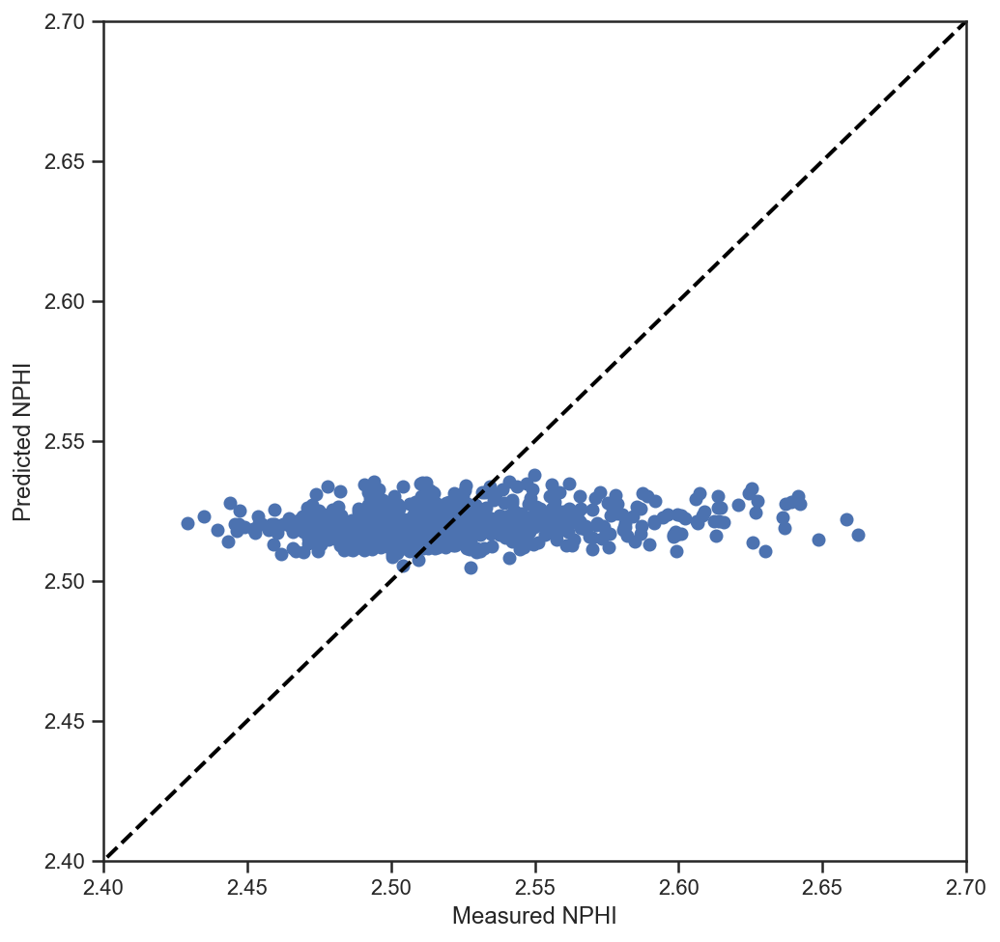

In [166]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([2.4, 2.7, 2.4, 2.7])
plt.scatter(y_test_mlp, y_pred_mlpop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted NPHI') # Predicted values on y axis
plt.xlabel('Measured NPHI') 

In [167]:
NPHI_mlp_OP = pd.DataFrame({'Measured NPHI':y_test_mlp, 'Predicted NPHI':y_pred_mlpop})
NPHI_mlp_OP.head()

,Measured NPHI,Predicted NPHI
5607,2.458347,2.520188
3314,2.492405,2.513132
3495,2.561688,2.517456
2496,2.515505,2.513357
4121,2.518935,2.519406


In [168]:
# Calculate the absolute errors
errors = abs(y_pred_mlpop - y_test_mlp)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_mlp)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 0.03 degrees.
Accuracy: 98.98 %.


In [169]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_mlp, y_pred_mlpop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_mlp, y_pred_mlpop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_mlp, y_pred_mlpop)))

Mean Absolute Error: 0.025742525593078706
Mean Squared Error: 0.0012123985631491343
Root Mean Squared Error: 0.03481951411420232
